# **DATA PREPARATION**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import torch
import os

CHECKPOINT_PATH = "/content/drive/MyDrive/checkpoints/train_ckpt.pt"

def save_checkpoint(epoch, model, optimizer, loss):
    torch.save({
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict(),
        "loss": loss
    }, CHECKPOINT_PATH)

def load_checkpoint(model, optimizer):
    if os.path.exists(CHECKPOINT_PATH):
        ckpt = torch.load(CHECKPOINT_PATH)
        model.load_state_dict(ckpt["model_state"])
        optimizer.load_state_dict(ckpt["optimizer_state"])
        print(f"Resumed from epoch {ckpt['epoch']}")
        return ckpt["epoch"] + 1
    return 0


In [ ]:
import signal

def timeout_handler(signum, frame):
    raise TimeoutError

signal.signal(signal.SIGALRM, timeout_handler)
signal.alarm(300)  # 5 minutes

try:
    val = input("Enter value:")
except TimeoutError:
    val = DEFAULT_VALUE
    print("No input received, using default")

signal.alarm(0)


Enter value:300


295

In [ ]:
torch.cuda.empty_cache()

**Step 1: Import & Explore Dataset**

In [ ]:
# Install required libraries
!pip install kagglehub
!pip install albumentations
!pip install opencv-python-headless
!pip install pillow
!pip install matplotlib
! pip install pandas
!pip install tqdm

import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import shutil
from collections import Counter
import json

In [ ]:
# Download dataset from Kaggle
import kagglehub

print("📥 Downloading dataset from Kaggle...")
path = kagglehub.dataset_download("pkdarabi/the-drug-name-detection-dataset")
print(f"✅ Dataset downloaded to: {path}")

# Explore dataset structure
print("\n📁 Dataset Structure:")
print("=" * 60)

for root, dirs, files in os.walk(path):
    level = root.replace(path, '').count(os.sep)
    indent = ' ' * 2 * level
    print(f"{indent}📁 {os.path.basename(root)}/")
    subindent = ' ' * 2 * (level + 1)

    # Show first 5 files only
    for file in files[:5]:
        print(f"{subindent}📄 {file}")
    if len(files) > 5:
        print(f"{subindent}... and {len(files) - 5} more files")

📥 Downloading dataset from Kaggle...


100%|██████████| 53.5M/53.5M [00:00<00:00, 129MB/s]

Extracting files...


✅ Dataset downloaded to: /root/.cache/kagglehub/datasets/pkdarabi/the-drug-name-detection-dataset/versions/1

📁 Dataset Structure:
📁 1/
  📄 data.yaml
  📁 train/
    📁 labels/
      📄 cephalexin-2-_jpeg.rf.9d882a334b43f5029c9b2ab042600867.txt
      📄 ramipril_JPG.rf.b62ef39af5c9a317d7b390b7ad844933.txt
      📄 MTA-37903299_brd-44261_a-lpenntin300-mg-per-strip-kya-healthcare_full04_jpg.rf.cd87ef1a6578a19dd314a7af374d2586.txt
      📄 cefuroxime_jpeg.rf.1d063f640bd2f991347e00991d55480b.txt
      📄 lidosporin_jpg.rf.abd1ae3d28a2857157307d4f183b8ca3.txt
      ... and 1271 more files
    📁 images/
      📄 20230812_214419_jpg.rf.c94a6c921411f8a69aaa9c7359f4c2a5.jpg
      📄 MTA-37655282_novartis_galvus_50_mg_box_28_tablet_full01_h3r7h22v_jpg.rf.4809813f4860431909347d29e0a37551.jpg
      📄 81ixXUyAemMHWirKSYallkzeWzx_jpg.rf.26ab9684b11d7cdb912f3ad135b5604f.jpg
      📄 20230812_220343_jpg.rf.3f095bfe6658b32c0d4cb38aaea46bce.jpg
      📄 Diazepam_jpeg.rf.0306c4b5faaf50ec7d48be06e26a3e11.jpg
      .

In [ ]:
# Analyze each split
splits = ['train', 'valid', 'test']
dataset_info = {}

print("\n📊 Dataset Statistics:")
print("=" * 60)

for split in splits:
    images_path = os.path.join(path, split, 'images')
    labels_path = os.path.join(path, split, 'labels')

    if os.path. exists(images_path):
        image_files = [f for f in os.listdir(images_path)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        label_files = []
        if os.path.exists(labels_path):
            label_files = [f for f in os.listdir(labels_path)
                          if f.endswith('.txt')]

        dataset_info[split] = {
            'images': len(image_files),
            'labels': len(label_files),
            'path': images_path
        }

        print(f"\n{split.upper()}:")
        print(f"  Images: {len(image_files)}")
        print(f"  Labels: {len(label_files)}")
        print(f"  Path: {images_path}")

total_images = sum([info['images'] for info in dataset_info.values()])
print(f"\n{'='*60}")
print(f"TOTAL IMAGES: {total_images}")
print(f"{'='*60}")


📊 Dataset Statistics:

TRAIN:
  Images: 1276
  Labels: 1276
  Path: /root/.cache/kagglehub/datasets/pkdarabi/the-drug-name-detection-dataset/versions/1/train/images

VALID:
  Images: 365
  Labels: 365
  Path: /root/.cache/kagglehub/datasets/pkdarabi/the-drug-name-detection-dataset/versions/1/valid/images

TEST:
  Images: 182
  Labels: 182
  Path: /root/.cache/kagglehub/datasets/pkdarabi/the-drug-name-detection-dataset/versions/1/test/images

TOTAL IMAGES: 1823


In [ ]:
# Sample image analysis
print("\n🔍 Analyzing Sample Images...")

def analyze_images(image_folder, num_samples=10):
    """Analyze image properties"""
    image_files = [f for f in os.listdir(image_folder)
                  if f.lower().endswith(('.jpg', '.jpeg', '.png'))][:num_samples]

    dimensions = []
    formats = []
    sizes = []

    for img_file in image_files:
        img_path = os.path.join(image_folder, img_file)
        try:
            img = Image.open(img_path)
            dimensions.append(img.size)
            formats.append(img.format)
            sizes.append(os.path.getsize(img_path) / 1024)  # KB
        except Exception as e:
            print(f"⚠️  Error reading {img_file}: {e}")

    return dimensions, formats, sizes

train_dims, train_formats, train_sizes = analyze_images(
    dataset_info['train']['path'],
    num_samples=50
)

print(f"\n📐 Image Dimensions (sample of 50):")
dim_counter = Counter([f"{w}x{h}" for w, h in train_dims])
for dim, count in dim_counter. most_common(5):
    print(f"  {dim}:  {count} images")

print(f"\n📋 Image Formats:")
format_counter = Counter(train_formats)
for fmt, count in format_counter.items():
    print(f"  {fmt}: {count} images")

print(f"\n💾 Image Sizes:")
print(f"  Average: {np.mean(train_sizes):.2f} KB")
print(f"  Min: {np.min(train_sizes):.2f} KB")
print(f"  Max:  {np.max(train_sizes):.2f} KB")


🔍 Analyzing Sample Images...

📐 Image Dimensions (sample of 50):
  640x640:  50 images

📋 Image Formats:
  JPEG: 50 images

💾 Image Sizes:
  Average: 28.83 KB
  Min: 13.78 KB
  Max:  48.79 KB



🖼️  Displaying Sample Images...


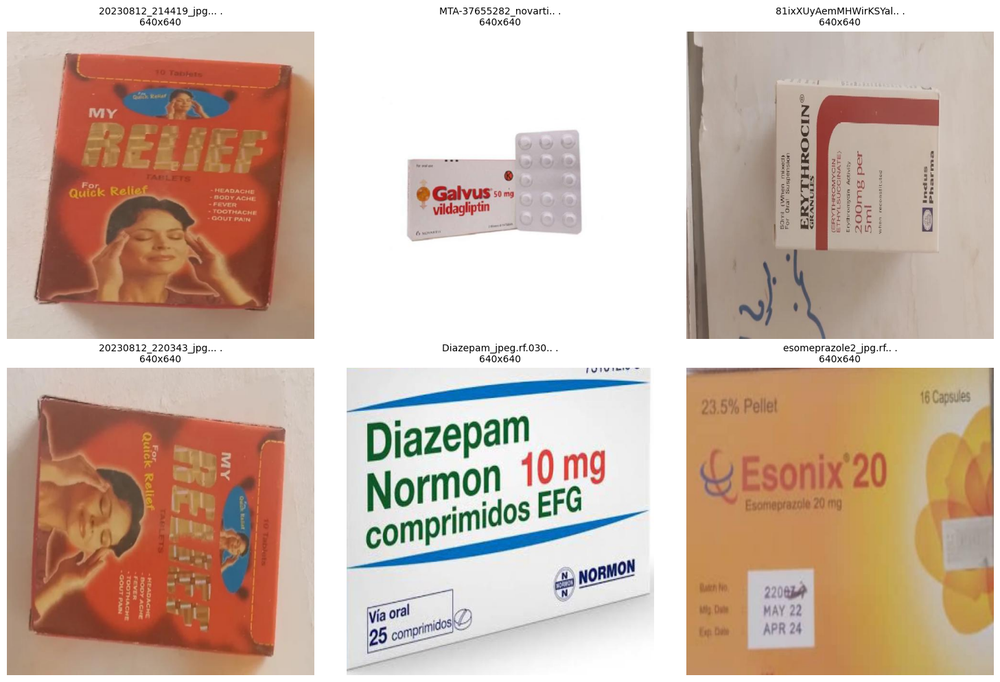

✅ Sample images saved to 'sample_images.png'

✅ Step 1 Complete:  Dataset explored and analyzed
📊 Dataset info saved to 'dataset_info. json'


In [ ]:
# Visualize sample images
print("\n🖼️  Displaying Sample Images...")

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

train_images_path = dataset_info['train']['path']
sample_files = [f for f in os. listdir(train_images_path)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))][:6]

for idx, img_file in enumerate(sample_files):
    img_path = os.path.join(train_images_path, img_file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    axes[idx].imshow(img)
    axes[idx].set_title(f"{img_file[: 20]}.. .\n{img. shape[1]}x{img.shape[0]}", fontsize=10)
    axes[idx].axis('off')

plt.tight_layout()
plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
plt.show()

print("✅ Sample images saved to 'sample_images.png'")

# Save dataset info
with open('dataset_info.json', 'w') as f:
    json.dump(dataset_info, f, indent=2)

print("\n✅ Step 1 Complete:  Dataset explored and analyzed")
print(f"📊 Dataset info saved to 'dataset_info. json'")

**Step 2: Data Cleaning**

In [ ]:
print("\n" + "="*60)
print("STEP 2: DATA CLEANING")
print("="*60)

def clean_dataset(dataset_path, split_name):
    """Clean dataset:  remove corrupt images, check label correspondence"""

    images_path = os.path.join(dataset_path, split_name, 'images')
    labels_path = os.path.join(dataset_path, split_name, 'labels')

    if not os.path.exists(images_path):
        print(f"⚠️  {split_name} images folder not found")
        return

    image_files = [f for f in os.listdir(images_path)
                  if f. lower().endswith(('.jpg', '.jpeg', '.png'))]

    print(f"\n🔍 Cleaning {split_name} split...")
    print(f"   Total images: {len(image_files)}")

    corrupt_images = []
    valid_images = []
    images_without_labels = []

    for img_file in tqdm(image_files, desc=f"Checking {split_name}"):
        img_path = os.path.join(images_path, img_file)

        # Check if image is readable
        try:
            img = cv2.imread(img_path)
            if img is None:
                corrupt_images.append(img_file)
                continue

            # Check if image has valid dimensions
            if img.shape[0] < 10 or img.shape[1] < 10:
                corrupt_images.append(img_file)
                continue

            valid_images.append(img_file)

            # Check if corresponding label exists
            if os.path.exists(labels_path):
                label_file = os.path.splitext(img_file)[0] + '.txt'
                label_path = os.path.join(labels_path, label_file)
                if not os.path.exists(label_path):
                    images_without_labels.append(img_file)

        except Exception as e:
            corrupt_images.append(img_file)

    # Remove corrupt images
    if corrupt_images:
        print(f"\n⚠️  Found {len(corrupt_images)} corrupt images")
        for corrupt_file in corrupt_images:
            try:
                os.remove(os.path.join(images_path, corrupt_file))
                print(f"   Removed: {corrupt_file}")
            except Exception as e:
                print(f"   Error removing {corrupt_file}: {e}")

    print(f"\n✅ {split_name} Cleaning Results:")
    print(f"   Valid images: {len(valid_images)}")
    print(f"   Corrupt removed: {len(corrupt_images)}")
    print(f"   Images without labels: {len(images_without_labels)}")

    return {
        'valid':  len(valid_images),
        'corrupt': len(corrupt_images),
        'no_label': len(images_without_labels)
    }



STEP 2: DATA CLEANING


In [ ]:
# Clean all splits
cleaning_results = {}
for split in splits:
    cleaning_results[split] = clean_dataset(path, split)

# Summary
print(f"\n{'='*60}")
print("CLEANING SUMMARY")
print(f"{'='*60}")

for split, results in cleaning_results. items():
    print(f"\n{split.upper()}:")
    print(f"  Valid:  {results['valid']}")
    print(f"  Corrupt:  {results['corrupt']}")
    print(f"  No label: {results['no_label']}")

total_valid = sum([r['valid'] for r in cleaning_results.values()])
total_corrupt = sum([r['corrupt'] for r in cleaning_results. values()])

print(f"\n{'='*60}")
print(f"TOTAL VALID IMAGES: {total_valid}")
print(f"TOTAL CORRUPT REMOVED: {total_corrupt}")
print(f"{'='*60}")

print("\n✅ Step 2 Complete: Dataset cleaned")



🔍 Cleaning train split...
   Total images: 1276


Checking train: 100%|██████████| 1276/1276 [00:08<00:00, 158.24it/s]



✅ train Cleaning Results:
   Valid images: 1276
   Corrupt removed: 0
   Images without labels: 0

🔍 Cleaning valid split...
   Total images: 365


Checking valid: 100%|██████████| 365/365 [00:01<00:00, 268.26it/s]



✅ valid Cleaning Results:
   Valid images: 365
   Corrupt removed: 0
   Images without labels: 0

🔍 Cleaning test split...
   Total images: 182


Checking test: 100%|██████████| 182/182 [00:00<00:00, 212.06it/s]


✅ test Cleaning Results:
   Valid images: 182
   Corrupt removed: 0
   Images without labels: 0

CLEANING SUMMARY

TRAIN:
  Valid:  1276
  Corrupt:  0
  No label: 0

VALID:
  Valid:  365
  Corrupt:  0
  No label: 0

TEST:
  Valid:  182
  Corrupt:  0
  No label: 0

TOTAL VALID IMAGES: 1823
TOTAL CORRUPT REMOVED: 0

✅ Step 2 Complete: Dataset cleaned


**Step 3: Data Augmentation**

In [ ]:
print("\n" + "="*60)
print("STEP 3: DATA AUGMENTATION")
print("="*60)

import albumentations as A

class MedicineAugmenter:
    """Augment medicine images with realistic transformations"""

    def __init__(self, target_total=15000):
        self.target_total = target_total

        # Define augmentation pipeline
        self.transform = A.Compose([
            # Geometric transformations
            A. Rotate(limit=25, p=0.7, border_mode=cv2.BORDER_CONSTANT, value=255),
            A.Perspective(scale=(0.05, 0.12), p=0.5, pad_mode=cv2.BORDER_CONSTANT, pad_val=255),
            A.ShiftScaleRotate(
                shift_limit=0.1,
                scale_limit=0.2,
                rotate_limit=15,
                border_mode=cv2.BORDER_CONSTANT,
                value=255,
                p=0.5
            ),

            # Lighting conditions
            A.RandomBrightnessContrast(
                brightness_limit=0.3,
                contrast_limit=0.3,
                p=0.8
            ),
            A.RandomShadow(
                shadow_roi=(0, 0.5, 1, 1),
                num_shadows_lower=1,
                num_shadows_upper=2,
                p=0.4
            ),
            A.RandomFog(
                fog_coef_lower=0.1,
                fog_coef_upper=0.2,
                p=0.2
            ),
            A.RandomSunFlare(
                flare_roi=(0, 0, 1, 0.5),
                angle_lower=0,
                angle_upper=1,
                num_flare_circles_lower=1,
                num_flare_circles_upper=2,
                p=0.15
            ),

            # Camera quality degradation
            A.GaussNoise(var_limit=(10, 50), p=0.4),
            A.MotionBlur(blur_limit=5, p=0.3),
            A.GaussianBlur(blur_limit=(3, 5), p=0.3),

            # Image compression
            A.ImageCompression(
                quality_lower=70,
                quality_upper=95,
                p=0.5
            ),

            # Partial occlusion
            A.CoarseDropout(
                max_holes=2,
                max_height=40,
                max_width=40,
                min_holes=1,
                min_height=20,
                min_width=20,
                fill_value=255,
                p=0.2
            ),

            # Color variations
            A.HueSaturationValue(
                hue_shift_limit=10,
                sat_shift_limit=20,
                val_shift_limit=10,
                p=0.3
            ),
        ])

    def augment_dataset(self, input_folder, output_folder, copy_labels=True):
        """
        Augment all images in input folder

        Args:
            input_folder: Path to original images
            output_folder: Path to save augmented images
            copy_labels: Whether to copy label files
        """

        # Create output folder
        os.makedirs(output_folder, exist_ok=True)

        # Get all images
        image_files = [f for f in os.listdir(input_folder)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        original_count = len(image_files)
        augmentations_per_image = (self.target_total // original_count) - 1

        print(f"\n📊 Augmentation Plan:")
        print(f"   Original images: {original_count}")
        print(f"   Target total: {self.target_total}")
        print(f"   Augmentations per image: {augmentations_per_image}")
        print(f"   Expected output: {original_count * (augmentations_per_image + 1)}")

        augmented_count = 0

        for img_file in tqdm(image_files, desc="Augmenting images"):
            img_path = os.path.join(input_folder, img_file)

            try:
                # Read image
                image = cv2.imread(img_path)
                if image is None:
                    print(f"⚠️  Could not read {img_file}")
                    continue

                # Save original
                base_name = os.path.splitext(img_file)[0]
                ext = os.path.splitext(img_file)[1]

                original_output = os.path.join(output_folder, f"orig_{img_file}")
                cv2.imwrite(original_output, image)
                augmented_count += 1

                # Generate augmented versions
                for i in range(augmentations_per_image):
                    try:
                        augmented = self.transform(image=image)['image']
                        output_filename = f"aug{i: 03d}_{base_name}{ext}"
                        output_path = os.path.join(output_folder, output_filename)
                        cv2.imwrite(output_path, augmented)
                        augmented_count += 1

                    except Exception as e:
                        print(f"⚠️  Error augmenting {img_file} (iteration {i}): {e}")

            except Exception as e:
                print(f"⚠️  Error processing {img_file}: {e}")

        print(f"\n✅ Augmentation Complete!")
        print(f"   Output folder: {output_folder}")
        print(f"   Total images generated: {augmented_count}")

        # Copy labels if requested
        if copy_labels:
            labels_input = input_folder. replace('images', 'labels')
            if os.path.exists(labels_input):
                labels_output = output_folder.replace('images', 'labels')
                os.makedirs(labels_output, exist_ok=True)

                print(f"\n📋 Copying label files...")
                for img_file in tqdm(image_files, desc="Copying labels"):
                    base_name = os.path.splitext(img_file)[0]
                    label_file = base_name + '.txt'
                    label_input_path = os.path.join(labels_input, label_file)

                    if os.path.exists(label_input_path):
                        # Copy for original
                        label_output_path = os.path.join(labels_output, f"orig_{label_file}")
                        shutil.copy2(label_input_path, label_output_path)

                        # Copy for each augmentation
                        for i in range(augmentations_per_image):
                            label_output_path = os.path.join(labels_output, f"aug{i:03d}_{label_file}")
                            shutil.copy2(label_input_path, label_output_path)

        return augmented_count



STEP 3: DATA AUGMENTATION


In [ ]:
# Create output directory for augmented data
augmented_base_path = "/content/augmented_medicine_dataset"
os.makedirs(augmented_base_path, exist_ok=True)

# Augment training data
print("\n🎨 Augmenting TRAIN split...")
train_input = os.path.join(path, 'train', 'images')
train_output = os.path.join(augmented_base_path, 'train', 'images')

augmenter = MedicineAugmenter(target_total=12000)  # 80% of 15K
train_augmented = augmenter. augment_dataset(train_input, train_output, copy_labels=True)

# Copy validation and test (no augmentation needed)
print("\n📁 Copying VALID split...")
valid_input = os.path.join(path, 'valid')
valid_output = os.path.join(augmented_base_path, 'valid')
if os.path.exists(valid_input):
    shutil.copytree(valid_input, valid_output, dirs_exist_ok=True)
    valid_count = len([f for f in os.listdir(os.path.join(valid_output, 'images'))
                       if f.endswith(('.jpg', '.png'))])
    print(f"   Copied {valid_count} validation images")

print("\n📁 Copying TEST split...")
test_input = os.path.join(path, 'test')
test_output = os.path. join(augmented_base_path, 'test')
if os.path.exists(test_input):
    shutil.copytree(test_input, test_output, dirs_exist_ok=True)
    test_count = len([f for f in os. listdir(os.path.join(test_output, 'images'))
                      if f.endswith(('.jpg', '.png'))])
    print(f"   Copied {test_count} test images")


/tmp/ipython-input-1472462428.py:16: UserWarning: Argument(s) 'value' are not valid for transform Rotate
  A. Rotate(limit=25, p=0.7, border_mode=cv2.BORDER_CONSTANT, value=255),
/tmp/ipython-input-1472462428.py:17: UserWarning: Argument(s) 'pad_mode, pad_val' are not valid for transform Perspective
  A.Perspective(scale=(0.05, 0.12), p=0.5, pad_mode=cv2.BORDER_CONSTANT, pad_val=255),
/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipython-input-1472462428.py:18: UserWarning: Argument(s) 'value' are not valid for transform ShiftScaleRotate
  A.ShiftScaleRotate(
/tmp/ipython-input-1472462428.py:33: UserWarning: Argument(s) 'num_shadows_lower, num_shadows_upper' are not valid for transform RandomShadow
  A.RandomShadow(
/tmp/ipython-input-1472462428.py:39: UserWarning: Argument(s) 'fog_coef_lower, fog_coef_


🎨 Augmenting TRAIN split...

📊 Augmentation Plan:
   Original images: 1276
   Target total: 12000
   Augmentations per image: 8
   Expected output: 11484


Augmenting images: 100%|██████████| 1276/1276 [22:42<00:00,  1.07s/it]



✅ Augmentation Complete!
   Output folder: /content/augmented_medicine_dataset/train/images
   Total images generated: 11484

📋 Copying label files...


Copying labels: 100%|██████████| 1276/1276 [00:02<00:00, 461.48it/s]



📁 Copying VALID split...
   Copied 365 validation images

📁 Copying TEST split...
   Copied 182 test images



🖼️  Visualizing Augmentation Results...


/tmp/ipython-input-1472462428.py:16: UserWarning: Argument(s) 'value' are not valid for transform Rotate
  A. Rotate(limit=25, p=0.7, border_mode=cv2.BORDER_CONSTANT, value=255),
/tmp/ipython-input-1472462428.py:17: UserWarning: Argument(s) 'pad_mode, pad_val' are not valid for transform Perspective
  A.Perspective(scale=(0.05, 0.12), p=0.5, pad_mode=cv2.BORDER_CONSTANT, pad_val=255),
/tmp/ipython-input-1472462428.py:18: UserWarning: Argument(s) 'value' are not valid for transform ShiftScaleRotate
  A.ShiftScaleRotate(
/tmp/ipython-input-1472462428.py:33: UserWarning: Argument(s) 'num_shadows_lower, num_shadows_upper' are not valid for transform RandomShadow
  A.RandomShadow(
/tmp/ipython-input-1472462428.py:39: UserWarning: Argument(s) 'fog_coef_lower, fog_coef_upper' are not valid for transform RandomFog
  A.RandomFog(
/tmp/ipython-input-1472462428.py:44: UserWarning: Argument(s) 'angle_lower, angle_upper, num_flare_circles_lower, num_flare_circles_upper' are not valid for transform 

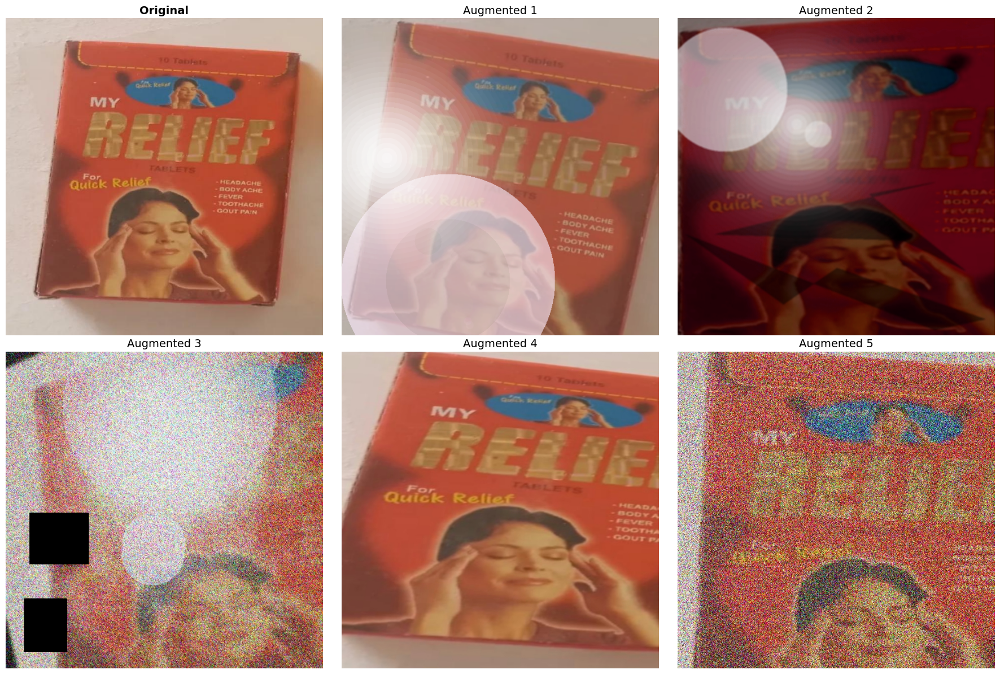

✅ Augmentation samples saved to 'augmentation_samples.png'

✅ Step 3 Complete: Data augmented to ~12K training images


In [ ]:
# Visualize augmentation results
print("\n🖼️  Visualizing Augmentation Results...")

# Pick one original image
original_img_path = os.path.join(train_input, os.listdir(train_input)[0])
original_img = cv2.imread(original_img_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Generate 5 augmented versions
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Show original
axes[0].imshow(original_img)
axes[0].set_title("Original", fontsize=14, fontweight='bold')
axes[0].axis('off')

# Show 5 augmented versions
augmenter_viz = MedicineAugmenter(target_total=15000)
for i in range(1, 6):
    augmented = augmenter_viz.transform(image=original_img)['image']
    axes[i]. imshow(augmented)
    axes[i].set_title(f"Augmented {i}", fontsize=14)
    axes[i].axis('off')

plt.tight_layout()
plt.savefig('augmentation_samples.png', dpi=150, bbox_inches='tight')
plt.show()

print("✅ Augmentation samples saved to 'augmentation_samples.png'")

print("\n✅ Step 3 Complete: Data augmented to ~12K training images")

**Step 4: Train/Val/Test Split & Organization**

In [ ]:
print("\n" + "="*60)
print("STEP 4: FINAL DATASET ORGANIZATION")
print("="*60)

def count_images_in_split(split_path):
    """Count images in a split"""
    images_path = os.path.join(split_path, 'images')
    if os.path.exists(images_path):
        return len([f for f in os.listdir(images_path)
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    return 0

# Count images in each split
final_counts = {}

for split in ['train', 'valid', 'test']:
    split_path = os.path.join(augmented_base_path, split)
    count = count_images_in_split(split_path)
    final_counts[split] = count

print("\n📊 Final Dataset Statistics:")
print("="*60)

total = sum(final_counts.values())

for split, count in final_counts.items():
    percentage = (count / total) * 100 if total > 0 else 0
    print(f"{split.upper():>10}:  {count:>6} images ({percentage: >5.1f}%)")

print(f"{'='*60}")
print(f"{'TOTAL': >10}:  {total:>6} images")
print(f"{'='*60}")

# Verify label correspondence
print("\n🔍 Verifying Image-Label Correspondence...")

for split in ['train', 'valid', 'test']:
    images_path = os.path.join(augmented_base_path, split, 'images')
    labels_path = os.path. join(augmented_base_path, split, 'labels')

    if os.path. exists(images_path) and os.path.exists(labels_path):
        image_files = set([os.path.splitext(f)[0] for f in os.listdir(images_path)
                          if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        label_files = set([os.path.splitext(f)[0] for f in os.listdir(labels_path)
                          if f.endswith('. txt')])

        matched = len(image_files & label_files)
        total_imgs = len(image_files)

        print(f"\n{split.upper()}:")
        print(f"  Images with labels: {matched}/{total_imgs} ({matched/total_imgs*100:.1f}%)")

        if matched < total_imgs:
            missing = image_files - label_files
            print(f"  ⚠️  Missing labels for {len(missing)} images")


STEP 4: FINAL DATASET ORGANIZATION

📊 Final Dataset Statistics:
     TRAIN:   11484 images ( 95.5%)
     VALID:     365 images (  3.0%)
      TEST:     182 images (  1.5%)
     TOTAL:   12031 images

🔍 Verifying Image-Label Correspondence...

TRAIN:
  Images with labels: 0/11484 (0.0%)
  ⚠️  Missing labels for 11484 images

VALID:
  Images with labels: 0/365 (0.0%)
  ⚠️  Missing labels for 365 images

TEST:
  Images with labels: 0/182 (0.0%)
  ⚠️  Missing labels for 182 images


In [ ]:
# Create summary report
summary = {
    'dataset_path': augmented_base_path,
    'total_images': total,
    'splits': final_counts,
    'target':  15000,
    'augmentation_factor': final_counts['train'] / dataset_info['train']['images'],
    'completion_date': pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')
}

# Save summary
with open('dataset_summary.json', 'w') as f:
    json.dump(summary, f, indent=2)

print("\n" + "="*60)
print("📋 DATASET SUMMARY")
print("="*60)
print(f"Dataset Path: {augmented_base_path}")
print(f"Total Images: {total}")
print(f"Target:  {summary['target']}")
print(f"Augmentation Factor: {summary['augmentation_factor']:.1f}x")
print(f"Completion:  {summary['completion_date']}")
print("="*60)

# Create data. yaml for YOLO format (if needed)
data_yaml_content = f"""
# MediScope Medicine Detection Dataset
path: {augmented_base_path}
train: train/images
val: valid/images
test: test/images

# Number of classes
nc: 1

# Class names
names: ['drug-name']

# Dataset info
total_images: {total}
train_images: {final_counts['train']}
val_images: {final_counts['valid']}
test_images:  {final_counts['test']}
"""

with open(os.path.join(augmented_base_path, 'data.yaml'), 'w') as f:
    f.write(data_yaml_content)

print(f"\n✅ data.yaml created at: {augmented_base_path}/data. yaml")


📋 DATASET SUMMARY
Dataset Path: /content/augmented_medicine_dataset
Total Images: 12031
Target:  15000
Augmentation Factor: 9.0x
Completion:  2026-01-06 08:45:23

✅ data.yaml created at: /content/augmented_medicine_dataset/data. yaml



📊 Creating Dataset Distribution Chart...


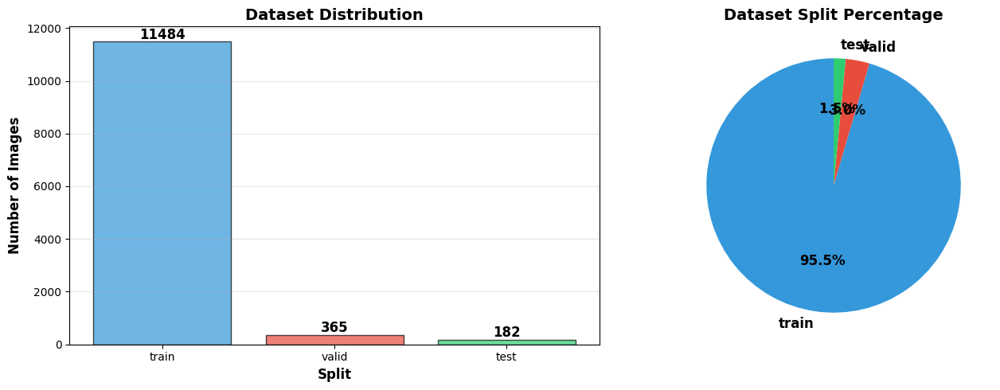

✅ Distribution chart saved to 'dataset_distribution.png'

🎉 PHASE 1 COMPLETE!

✅ Dataset prepared with 12031 images
✅ Augmentation complete
✅ Train/Val/Test split verified
✅ Ready for Phase 2: OCR Pipeline Development

📁 Final dataset location: /content/augmented_medicine_dataset

💾 Dataset path saved to 'dataset_path. txt' for use in next phases


In [ ]:
# Final visualization:  Show distribution
print("\n📊 Creating Dataset Distribution Chart...")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Bar chart
splits_list = list(final_counts.keys())
counts_list = list(final_counts. values())
colors = ['#3498db', '#e74c3c', '#2ecc71']

axes[0].bar(splits_list, counts_list, color=colors, alpha=0.7, edgecolor='black')
axes[0].set_xlabel('Split', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Number of Images', fontsize=12, fontweight='bold')
axes[0].set_title('Dataset Distribution', fontsize=14, fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)

for i, (split, count) in enumerate(zip(splits_list, counts_list)):
    axes[0].text(i, count + 100, str(count), ha='center', fontsize=12, fontweight='bold')

# Pie chart
axes[1].pie(counts_list, labels=splits_list, autopct='%1.1f%%',
            colors=colors, startangle=90, textprops={'fontsize': 12, 'fontweight': 'bold'})
axes[1].set_title('Dataset Split Percentage', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig('dataset_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

print("✅ Distribution chart saved to 'dataset_distribution.png'")

print("\n" + "="*60)
print("🎉 PHASE 1 COMPLETE!")
print("="*60)
print(f"\n✅ Dataset prepared with {total} images")
print(f"✅ Augmentation complete")
print(f"✅ Train/Val/Test split verified")
print(f"✅ Ready for Phase 2: OCR Pipeline Development")
print(f"\n📁 Final dataset location: {augmented_base_path}")
print("="*60)

# Save dataset path for next phases
with open('dataset_path. txt', 'w') as f:
    f.write(augmented_base_path)

print("\n💾 Dataset path saved to 'dataset_path. txt' for use in next phases")

In [ ]:
# ============================================================================
# OPTIONAL: Run all steps sequentially
# ============================================================================

# If you want to run everything at once, execute this cell after running
# the installation cell at the top

def run_complete_phase1():
    """Execute all Phase 1 steps in sequence"""

    print("="*70)
    print(" " * 15 + "MEDISCOPE OCR - PHASE 1")
    print(" " * 15 + "DATA PREPARATION")
    print("="*70)

    # Note: You need to copy the code from Steps 1-4 above into functions
    # Then call them here in sequence

    print("\n✅ All Phase 1 steps completed successfully!")
    print("\nNext:  Proceed to Phase 2 - OCR Pipeline Development")

# Uncomment to run all at once:
# run_complete_phase1()

In [ ]:
# Create project folder in Drive
project_name = "MediScope_OCR_Project"
drive_project_path = f"/content/drive/MyDrive/{project_name}"
os.makedirs(drive_project_path, exist_ok=True)

print(f"\n📂 Project folder created: {drive_project_path}")

# Create Phase 1 folder
phase1_drive_path = os.path.join(drive_project_path, "Phase1_Data")
os.makedirs(phase1_drive_path, exist_ok=True)

# 1. Copy augmented dataset
# ============================================================================

print("\n📦 Copying augmented dataset to Google Drive...")
print("⚠️  This may take 10-20 minutes depending on size...")

augmented_dataset_drive = os.path.join(phase1_drive_path, "augmented_medicine_dataset")

if os.path.exists(augmented_base_path):
    # Copy entire dataset
    shutil.copytree(
        augmented_base_path,
        augmented_dataset_drive,
        dirs_exist_ok=True
    )
    print(f"✅ Dataset copied to:  {augmented_dataset_drive}")
else:
    print("⚠️  Augmented dataset not found!")




📂 Project folder created: /content/drive/MyDrive/MediScope_OCR_Project

📦 Copying augmented dataset to Google Drive...
⚠️  This may take 10-20 minutes depending on size...
✅ Dataset copied to:  /content/drive/MyDrive/MediScope_OCR_Project/Phase1_Data/augmented_medicine_dataset


In [ ]:
# 2. Copy all output files
# ============================================================================

print("\n📄 Copying output files...")

output_files = [
    'dataset_info.json',
    'dataset_summary.json',
    'dataset_path.txt',
    'sample_images.png',
    'augmentation_samples.png',
    'dataset_distribution.png'
]

for file in output_files:
    if os.path.exists(file):
        shutil.copy2(file, phase1_drive_path)
        print(f"✅ Copied:  {file}")
    else:
        print(f"⚠️  Not found: {file}")


📄 Copying output files...
✅ Copied:  dataset_info.json
✅ Copied:  dataset_summary.json
⚠️  Not found: dataset_path.txt
✅ Copied:  sample_images.png
✅ Copied:  augmentation_samples.png
✅ Copied:  dataset_distribution.png


In [ ]:
# ============================================================================
# 3. Create README with dataset info
# ============================================================================
import shutil
from datetime import datetime
readme_content = f"""
# MediScope OCR Project - Phase 1 Data

## Dataset Information

**Created:** {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}

**Original Dataset:**
- Source:  Kaggle - pkdarabi/the-drug-name-detection-dataset
- Original images: ~2,000

**Augmented Dataset:**
- Total images: {total}
- Train:  {final_counts['train']} images (80%)
- Valid: {final_counts['valid']} images (10%)
- Test: {final_counts['test']} images (10%)
- Augmentation factor: {summary['augmentation_factor']:.1f}x

**Dataset Location:**
- Google Drive: {augmented_dataset_drive}
- Colab (temporary): {augmented_base_path}

**Files Included:**
- dataset_info.json: Original dataset statistics
- dataset_summary.json: Augmented dataset summary
- sample_images.png: Visualization of original images
- augmentation_samples.png: Before/after augmentation examples
- dataset_distribution.png: Train/val/test split chart
- augmented_medicine_dataset/: Full augmented dataset with labels

**Augmentation Techniques Applied:**
- Geometric:  Rotation (±25°), Perspective, Scale, Shift
- Lighting: Brightness/Contrast, Shadows, Sun flare, Fog
- Quality: Motion blur, Gaussian noise, JPEG compression
- Occlusion: Random dropouts, Partial visibility
- Color: Hue/Saturation/Value shifts

**Next Steps:**
- Phase 2: OCR Pipeline Development
- Phase 3: Named Entity Recognition (NER)
- Phase 4: Knowledge Base Integration

**Notes:**
- All images are in JPG/PNG format
- Labels are in YOLO format (. txt files)
- data.yaml included for YOLO compatibility
"""

readme_path = os.path.join(phase1_drive_path, "README.md")
with open(readme_path, 'w') as f:
    f.write(readme_content)

print(f"\n✅ README created:  {readme_path}")

# ============================================================================
# 4. Save dataset path for future phases
# ============================================================================

# Update dataset_path.txt to point to Drive location
drive_dataset_path_file = os.path.join(phase1_drive_path, "dataset_path.txt")
with open(drive_dataset_path_file, 'w') as f:
    f.write(augmented_dataset_drive)

print(f"✅ Dataset path saved for future phases")

# ============================================================================
# 5. Create backup timestamp
# ============================================================================

backup_info = {
    'backup_date': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
    'colab_path': augmented_base_path,
    'drive_path': augmented_dataset_drive,
    'total_images': total,
    'train_images': final_counts['train'],
    'val_images': final_counts['valid'],
    'test_images':  final_counts['test'],
    'phase':  'Phase 1 Complete'
}

backup_info_path = os.path.join(phase1_drive_path, "backup_info.json")
with open(backup_info_path, 'w') as f:
    json.dump(backup_info, f, indent=2)

print(f"✅ Backup info saved")

# ============================================================================
# Summary
# ============================================================================

print("\n" + "="*70)
print(" " * 20 + "BACKUP COMPLETE!")
print("="*70)

print(f"\n📊 Backup Summary:")
print(f"   Drive location: {phase1_drive_path}")
print(f"   Dataset:  {augmented_dataset_drive}")
print(f"   Total size: ~{total} images")
print(f"   Files saved: {len(output_files)} output files + dataset")

print("\n✅ All Phase 1 data safely backed up to Google Drive")
print("✅ You can now close this session without losing data")
print(f"\n📁 Access your data at:")
print(f"   Google Drive > MyDrive > {project_name} > Phase1_Data")

print("\n" + "="*70)


✅ README created:  /content/drive/MyDrive/MediScope_OCR_Project/Phase1_Data/README.md
✅ Dataset path saved for future phases
✅ Backup info saved

                    BACKUP COMPLETE!

📊 Backup Summary:
   Drive location: /content/drive/MyDrive/MediScope_OCR_Project/Phase1_Data
   Dataset:  /content/drive/MyDrive/MediScope_OCR_Project/Phase1_Data/augmented_medicine_dataset
   Total size: ~12031 images
   Files saved: 6 output files + dataset

✅ All Phase 1 data safely backed up to Google Drive
✅ You can now close this session without losing data

📁 Access your data at:
   Google Drive > MyDrive > MediScope_OCR_Project > Phase1_Data



# **OCR PIPELINE DEVELOPMENT**

In [ ]:
# ============================================================================
# LOAD PHASE 1 DATA FROM GOOGLE DRIVE
# ============================================================================

from google. colab import drive
import os
import json

print("="*70)
print(" " * 15 + "LOADING PHASE 1 DATA FROM GOOGLE DRIVE")
print("="*70)

# Mount Google Drive
print("\n📁 Mounting Google Drive...")
drive.mount('/content/drive')
print("✅ Google Drive mounted")

# Project paths
project_name = "MediScope_OCR_Project"
drive_project_path = f"/content/drive/MyDrive/{project_name}"
phase1_drive_path = os. path.join(drive_project_path, "Phase1_Data")

# Load dataset path
dataset_path_file = os.path. join(phase1_drive_path, "dataset_path.txt")
if os.path.exists(dataset_path_file):
    with open(dataset_path_file, 'r') as f:
        augmented_base_path = f.read().strip()
    print(f"✅ Dataset path loaded:  {augmented_base_path}")
else:
    print("⚠️  Dataset path file not found!")
    augmented_base_path = os.path.join(phase1_drive_path, "augmented_medicine_dataset")

# Load dataset summary
summary_file = os.path.join(phase1_drive_path, "dataset_summary.json")
if os.path.exists(summary_file):
    with open(summary_file, 'r') as f:
        dataset_summary = json.load(f)
    print(f"✅ Dataset summary loaded")
    print(f"   Total images: {dataset_summary['total_images']}")
    print(f"   Train:  {dataset_summary['splits']['train']}")
    print(f"   Valid: {dataset_summary['splits']['valid']}")
    print(f"   Test:  {dataset_summary['splits']['test']}")
else:
    print("⚠️  Dataset summary not found!")

# Verify dataset exists
if os.path.exists(augmented_base_path):
    print(f"\n✅ Dataset verified at: {augmented_base_path}")
else:
    print(f"\n⚠️  Dataset not found at: {augmented_base_path}")

print("\n" + "="*70)
print("✅ Phase 1 data loaded successfully - Ready for Phase 2!")
print("="*70)

               LOADING PHASE 1 DATA FROM GOOGLE DRIVE

📁 Mounting Google Drive...
Mounted at /content/drive
✅ Google Drive mounted
✅ Dataset path loaded:  /content/drive/MyDrive/MediScope_OCR_Project/Phase1_Data/augmented_medicine_dataset
✅ Dataset summary loaded
   Total images: 12031
   Train:  11484
   Valid: 365
   Test:  182

✅ Dataset verified at: /content/drive/MyDrive/MediScope_OCR_Project/Phase1_Data/augmented_medicine_dataset

✅ Phase 1 data loaded successfully - Ready for Phase 2!


**Step 5: Test Preprocessing Methods**

In [ ]:
# ============================================================================
# PHASE 2: OCR PIPELINE DEVELOPMENT
# Step 5: Test Preprocessing Methods
# ============================================================================

print("\n" + "="*70)
print(" " * 20 + "PHASE 2: OCR PIPELINE")
print(" " * 20 + "Step 5: Test Preprocessing Methods")
print("="*70)

# Install required libraries
! pip install pytesseract
! apt-get install tesseract-ocr
!pip install pdf2image

import cv2
import numpy as np
import pytesseract
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
from collections import Counter

class OCRPreprocessor:
    """Test multiple preprocessing methods for OCR"""

    def __init__(self):
        self.methods = ["simple", "adaptive", "otsu", "none"]

    def preprocess_image(self, img, method="adaptive"):
        """
        Apply different preprocessing techniques

        Args:
            img: Input image (BGR)
            method: Preprocessing method to apply

        Returns:
            Preprocessed image
        """
        # Convert to grayscale
        if len(img.shape) == 3:
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        else:
            gray = img. copy()

        if method == "simple":
            # Simple Gaussian blur
            processed = cv2.GaussianBlur(gray, (3, 3), 0)
            return processed

        elif method == "adaptive":
            # Adaptive thresholding (best for uneven lighting)
            blur = cv2.GaussianBlur(gray, (5, 5), 0)
            processed = cv2.adaptiveThreshold(
                blur,
                255,
                cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                cv2.THRESH_BINARY,
                11,
                2
            )
            return processed

        elif method == "otsu":
            # Otsu's thresholding (automatic)
            blur = cv2.GaussianBlur(gray, (5, 5), 0)
            _, processed = cv2.threshold(
                blur,
                0,
                255,
                cv2.THRESH_BINARY + cv2.THRESH_OTSU
            )
            return processed

        else:  # "none"
            # Just grayscale
            return gray

    def extract_text(self, img, method="adaptive"):
        """
        Extract text using Tesseract OCR

        Args:
            img: Input image
            method: Preprocessing method

        Returns:
            dict with text and metadata
        """
        # Preprocess
        processed = self.preprocess_image(img, method)

        # OCR with Tesseract
        try:
            # Extract text
            text = pytesseract.image_to_string(processed)

            # Get detailed data
            data = pytesseract.image_to_data(processed, output_type=pytesseract. Output.DICT)

            # Calculate average confidence
            confidences = [int(conf) for conf in data['conf'] if conf != '-1']
            avg_confidence = np.mean(confidences) if confidences else 0

            return {
                'text': text,
                'confidence':  avg_confidence / 100,  # Normalize to 0-1
                'method': method,
                'processed_image': processed
            }

        except Exception as e:
            return {
                'text': '',
                'confidence': 0,
                'method': method,
                'error': str(e)
            }

    def test_all_methods(self, img):
        """
        Test all preprocessing methods on one image

        Returns:
            List of results for each method
        """
        results = []

        for method in self.methods:
            result = self.extract_text(img, method)
            results.append(result)

        return results

# Initialize preprocessor
preprocessor = OCRPreprocessor()

# Test on sample images
print("\n🔍 Testing preprocessing methods on sample images...")

train_images_path = os.path.join(augmented_base_path, 'train', 'images')
sample_files = [f for f in os.listdir(train_images_path)
                if f.lower().endswith(('.jpg', '.png'))][:500]  # Test on 500 images

print(f"   Testing on {len(sample_files)} images")
print(f"   This may take 5-10 minutes...")

# Collect results
all_results = []

for img_file in tqdm(sample_files, desc="Testing preprocessing"):
    img_path = os.path.join(train_images_path, img_file)

    try:
        img = cv2.imread(img_path)
        if img is None:
            continue

        # Test all methods
        results = preprocessor. test_all_methods(img)

        for result in results:
            all_results.append({
                'filename': img_file,
                'method': result['method'],
                'ocr_text': result['text'],
                'confidence': result['confidence'],
                'text_len': len(result['text']),
                'num_digits': sum(c.isdigit() for c in result['text']),
                'num_caps': sum(c.isupper() for c in result['text']),
                'num_lower':  sum(c.islower() for c in result['text']),
                'num_words': len(result['text'].split()),
                'avg_word_len': np.mean([len(w) for w in result['text']. split()]) if result['text'].split() else 0
            })

    except Exception as e:
        print(f"⚠️  Error processing {img_file}: {e}")

# Create DataFrame
results_df = pd.DataFrame(all_results)

# Save results
results_csv_path = 'ocr_preprocessing_comparison.csv'
results_df. to_csv(results_csv_path, index=False)

print(f"\n✅ OCR testing complete!")
print(f"   Total tests: {len(results_df)} (500 images × 4 methods)")
print(f"   Results saved to: {results_csv_path}")




                    PHASE 2: OCR PIPELINE
                    Step 5: Test Preprocessing Methods
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.

🔍 Testing preprocessing methods on sample images...
   Testing on 500 images
   This may take 5-10 minutes...


Testing preprocessing: 100%|██████████| 500/500 [31:36<00:00,  3.79s/it]


✅ OCR testing complete!
   Total tests: 2000 (500 images × 4 methods)
   Results saved to: ocr_preprocessing_comparison.csv



📊 Analyzing preprocessing method performance...

METHOD COMPARISON
          text_len  confidence  num_words  num_digits  num_caps
method                                                         
adaptive     24.44        0.18       4.06        0.66      3.83
none         21.75        0.19       3.14        0.76      3.74
otsu         19.67        0.17       2.98        0.59      3.23
simple       21.33        0.19       3.06        0.79      3.53

📈 Best Method Frequency:
    simple:   278 times ( 55.6%)
  adaptive:   127 times ( 25.4%)
      none:    59 times ( 11.8%)
      otsu:    36 times (  7.2%)


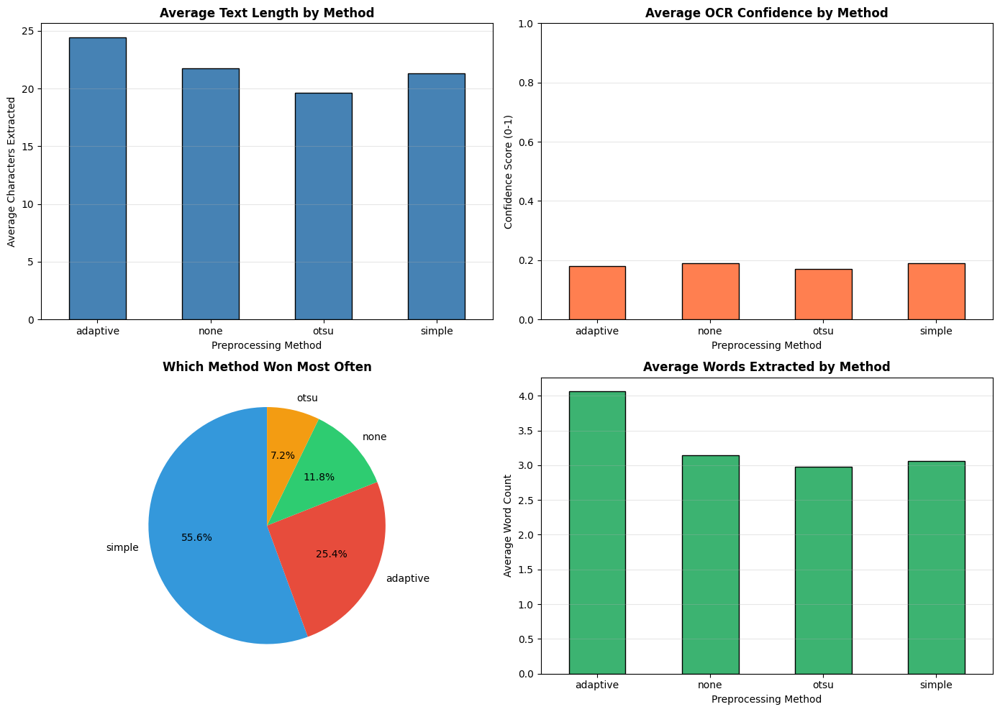


✅ Visualization saved to 'preprocessing_method_comparison.png'


In [ ]:
# ============================================================================
# Analyze results
# ============================================================================

print("\n📊 Analyzing preprocessing method performance...")

# Group by method
method_stats = results_df.groupby('method').agg({
    'text_len': 'mean',
    'confidence': 'mean',
    'num_words': 'mean',
    'num_digits': 'mean',
    'num_caps': 'mean'
}).round(2)

print("\n" + "="*70)
print("METHOD COMPARISON")
print("="*70)
print(method_stats.to_string())

# Find best method per image
results_df['is_best'] = 0
best_idx = results_df.groupby('filename')['text_len'].idxmax()
results_df.loc[best_idx, 'is_best'] = 1

# Count which method won most often
best_method_counts = results_df[results_df['is_best'] == 1]['method'].value_counts()

print("\n📈 Best Method Frequency:")
print("="*70)
for method, count in best_method_counts.items():
    percentage = (count / len(sample_files)) * 100
    print(f"{method: >10}:  {count:>4} times ({percentage: >5.1f}%)")

# Visualize method comparison
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 1. Average text length by method
ax1 = axes[0, 0]
method_stats['text_len'].plot(kind='bar', ax=ax1, color='steelblue', edgecolor='black')
ax1.set_title('Average Text Length by Method', fontsize=12, fontweight='bold')
ax1.set_xlabel('Preprocessing Method')
ax1.set_ylabel('Average Characters Extracted')
ax1.grid(axis='y', alpha=0.3)
ax1.tick_params(axis='x', rotation=0)

# 2. Average confidence by method
ax2 = axes[0, 1]
method_stats['confidence'].plot(kind='bar', ax=ax2, color='coral', edgecolor='black')
ax2.set_title('Average OCR Confidence by Method', fontsize=12, fontweight='bold')
ax2.set_xlabel('Preprocessing Method')
ax2.set_ylabel('Confidence Score (0-1)')
ax2.set_ylim(0, 1)
ax2.grid(axis='y', alpha=0.3)
ax2.tick_params(axis='x', rotation=0)

# 3. Best method distribution
ax3 = axes[1, 0]
best_method_counts.plot(kind='pie', ax=ax3, autopct='%1.1f%%', startangle=90,
                        colors=['#3498db', '#e74c3c', '#2ecc71', '#f39c12'])
ax3.set_title('Which Method Won Most Often', fontsize=12, fontweight='bold')
ax3.set_ylabel('')

# 4. Words extracted by method
ax4 = axes[1, 1]
method_stats['num_words'].plot(kind='bar', ax=ax4, color='mediumseagreen', edgecolor='black')
ax4.set_title('Average Words Extracted by Method', fontsize=12, fontweight='bold')
ax4.set_xlabel('Preprocessing Method')
ax4.set_ylabel('Average Word Count')
ax4.grid(axis='y', alpha=0.3)
ax4.tick_params(axis='x', rotation=0)

plt.tight_layout()
plt.savefig('preprocessing_method_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✅ Visualization saved to 'preprocessing_method_comparison.png'")




🖼️  Visualizing preprocessing methods on sample image...


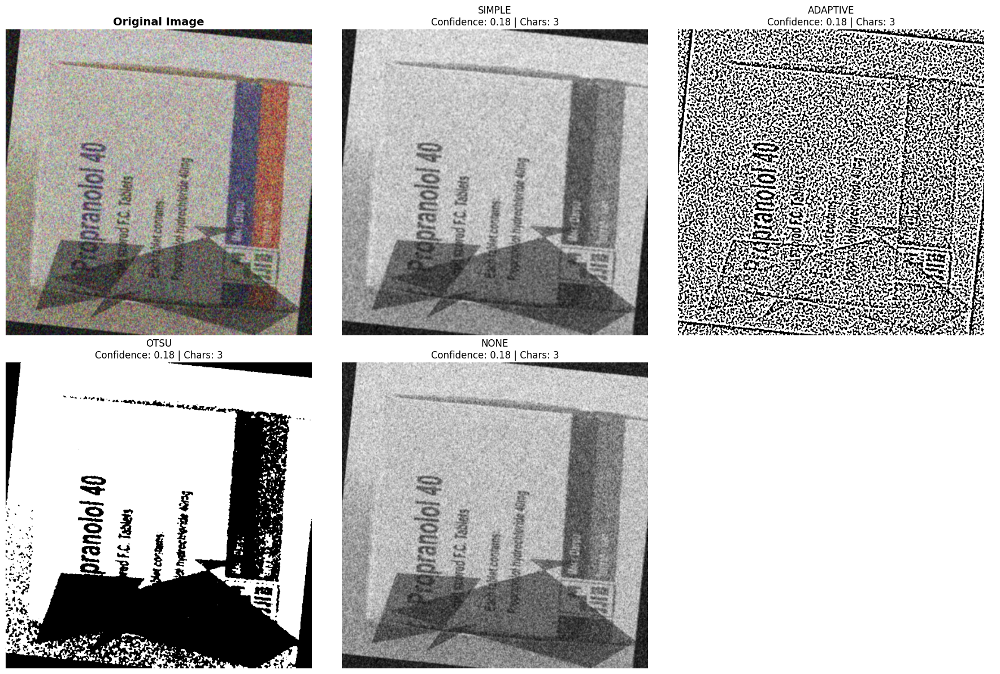

✅ Visual comparison saved to 'preprocessing_visual_comparison.png'

✅ Step 5 Complete:  Preprocessing methods tested and analyzed
📊 Results:  2000 OCR tests completed
📁 Data saved:  ocr_preprocessing_comparison.csv


In [ ]:
# ============================================================================
# Show examples of each method
# ============================================================================

print("\n🖼️  Visualizing preprocessing methods on sample image...")

# Pick one image
sample_img_path = os.path.join(train_images_path, sample_files[0])
sample_img = cv2.imread(sample_img_path)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Original
axes[0].imshow(cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Each preprocessing method
for idx, method in enumerate(preprocessor.methods, start=1):
    processed = preprocessor.preprocess_image(sample_img, method)
    result = preprocessor.extract_text(sample_img, method)

    axes[idx].imshow(processed, cmap='gray')
    axes[idx].set_title(
        f"{method. upper()}\n"
        f"Confidence: {result['confidence']:.2f} | "
        f"Chars: {len(result['text'])}",
        fontsize=12
    )
    axes[idx].axis('off')

# Hide last subplot
axes[5].axis('off')

plt.tight_layout()
plt.savefig('preprocessing_visual_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print("✅ Visual comparison saved to 'preprocessing_visual_comparison.png'")

# Save updated results with is_best column
results_df.to_csv(results_csv_path, index=False)

print("\n✅ Step 5 Complete:  Preprocessing methods tested and analyzed")
print(f"📊 Results:  {len(results_df)} OCR tests completed")
print(f"📁 Data saved:  {results_csv_path}")

**Step 6: Analyze Preprocessing Results**

In [ ]:
# ============================================================================
# Step 6: Analyze Preprocessing Results in Detail
# ============================================================================

print("\n" + "="*70)
print(" " * 20 + "Step 6: Analyze Preprocessing Results")
print("="*70)

# Load results
results_df = pd. read_csv('ocr_preprocessing_comparison.csv')

print(f"\n📊 Loaded {len(results_df)} OCR test results")



                    Step 6: Analyze Preprocessing Results

📊 Loaded 2000 OCR test results


In [ ]:
# ============================================================================
# 1. Statistical Analysis
# ============================================================================

print("\n" + "="*70)
print("DETAILED STATISTICAL ANALYSIS")
print("="*70)

# Overall statistics
print("\n📈 Overall Statistics:")
print(f"   Total images tested: {results_df['filename'].nunique()}")
print(f"   Total OCR runs: {len(results_df)}")
print(f"   Average text length: {results_df['text_len'].mean():.1f} characters")
print(f"   Average confidence: {results_df['confidence'].mean():.2%}")
print(f"   Average words extracted: {results_df['num_words'].mean():.1f}")

# Method-wise detailed stats
print("\n📊 Method-wise Statistics:")
print("-" * 70)

for method in preprocessor. methods:
    method_data = results_df[results_df['method'] == method]

    print(f"\n{method.upper()}:")
    print(f"   Text length:     Mean={method_data['text_len']. mean():.1f}, "
          f"Median={method_data['text_len'].median():.1f}, "
          f"Std={method_data['text_len'].std():.1f}")
    print(f"   Confidence:     Mean={method_data['confidence'].mean():.2%}, "
          f"Median={method_data['confidence'].median():.2%}")
    print(f"   Words:          Mean={method_data['num_words'].mean():.1f}, "
          f"Max={method_data['num_words'].max():.0f}")
    print(f"   Digits found:   Mean={method_data['num_digits']. mean():.1f}")
    print(f"   Success rate:   {(method_data['text_len'] > 10).sum() / len(method_data):.1%} "
          f"(extracted >10 chars)")



DETAILED STATISTICAL ANALYSIS

📈 Overall Statistics:
   Total images tested: 500
   Total OCR runs: 2000
   Average text length: 21.8 characters
   Average confidence: 18.16%
   Average words extracted: 3.3

📊 Method-wise Statistics:
----------------------------------------------------------------------

SIMPLE:
   Text length:     Mean=21.3, Median=3.0, Std=35.5
   Confidence:     Mean=18.53%, Median=18.20%
   Words:          Mean=3.1, Max=40
   Digits found:   Mean=0.8
   Success rate:   32.4% (extracted >10 chars)

ADAPTIVE:
   Text length:     Mean=24.4, Median=3.0, Std=40.2
   Confidence:     Mean=17.93%, Median=18.20%
   Words:          Mean=4.1, Max=42
   Digits found:   Mean=0.7
   Success rate:   30.0% (extracted >10 chars)

OTSU:
   Text length:     Mean=19.7, Median=3.0, Std=33.4
   Confidence:     Mean=17.46%, Median=18.20%
   Words:          Mean=3.0, Max=40
   Digits found:   Mean=0.6
   Success rate:   29.8% (extracted >10 chars)

NONE:
   Text length:     Mean=21.8, Me


FEATURE CORRELATIONS

Correlation with 'is_best' (which method performed best):
num_words     0.264383
text_len      0.247100
num_caps      0.174653
num_digits    0.109466
confidence    0.083815


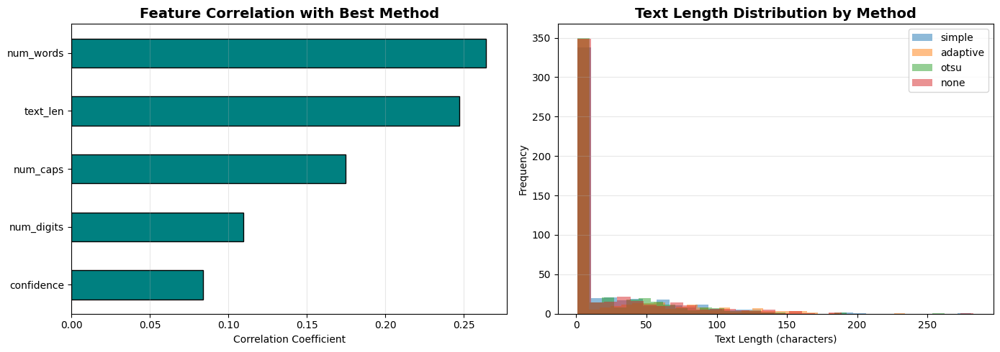


✅ Detailed analysis visualization saved


In [ ]:
# ============================================================================
# 2. Correlation Analysis
# ============================================================================

print("\n" + "="*70)
print("FEATURE CORRELATIONS")
print("="*70)

# Features correlation with "is_best"
numeric_cols = ['text_len', 'confidence', 'num_words', 'num_digits', 'num_caps']
correlations = results_df[numeric_cols + ['is_best']].corr()['is_best'].drop('is_best')

print("\nCorrelation with 'is_best' (which method performed best):")
print(correlations.sort_values(ascending=False).to_string())

# Visualize correlations
fig, axes = plt. subplots(1, 2, figsize=(14, 5))

# Correlation bar chart
ax1 = axes[0]
correlations. sort_values().plot(kind='barh', ax=ax1, color='teal', edgecolor='black')
ax1.set_title('Feature Correlation with Best Method', fontsize=14, fontweight='bold')
ax1.set_xlabel('Correlation Coefficient')
ax1.grid(axis='x', alpha=0.3)

# Text length distribution by method
ax2 = axes[1]
for method in preprocessor.methods:
    method_data = results_df[results_df['method'] == method]['text_len']
    ax2.hist(method_data, alpha=0.5, label=method, bins=30)

ax2.set_title('Text Length Distribution by Method', fontsize=14, fontweight='bold')
ax2.set_xlabel('Text Length (characters)')
ax2.set_ylabel('Frequency')
ax2.legend()
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('preprocessing_analysis_detailed.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✅ Detailed analysis visualization saved")

In [ ]:
# ============================================================================
# 3. Identify Best Performers
# ============================================================================

print("\n" + "="*70)
print("BEST PERFORMING EXAMPLES")
print("="*70)

# Find images where all methods did well
grouped = results_df.groupby('filename')['text_len'].agg(['mean', 'std', 'max'])
best_images = grouped.nlargest(10, 'mean')

print("\n🏆 Top 10 images (most text extracted across all methods):")
for idx, (filename, row) in enumerate(best_images.iterrows(), 1):
    print(f"   {idx}. {filename[:40]:<42} Avg: {row['mean']:.0f} chars, Max: {row['max']:.0f}")

# Find images where methods differed most
worst_consistency = grouped.nlargest(10, 'std')

print("\n⚠️  Top 10 images with most method disagreement (high std):")
for idx, (filename, row) in enumerate(worst_consistency.iterrows(), 1):
    print(f"   {idx}. {filename[:40]:<42} Avg: {row['mean']:.0f}, Std: {row['std']:.0f}")


BEST PERFORMING EXAMPLES

🏆 Top 10 images (most text extracted across all methods):
   1. orig_aripiprazole_jpg.rf.de5a9a95c984a0c   Avg: 207 chars, Max: 283
   2. orig_dicyclomine3_jpg.rf.020c9575c804bb4   Avg: 203 chars, Max: 234
   3. aug 07_dicyclomine3_jpg.rf.020c9575c804b   Avg: 144 chars, Max: 183
   4. orig_81ETmslUiwInnVDFKSDOkSkDDVo_jpg.rf.   Avg: 140 chars, Max: 190
   5. orig_20230812_214918_jpg.rf.c44872451344   Avg: 138 chars, Max: 151
   6. aug 03_MTA-37982249_tidak_ada_merk_salbu   Avg: 126 chars, Max: 163
   7. orig_norgestimate-ethinyl_jpg.rf.aa1d817   Avg: 120 chars, Max: 192
   8. aug 05_MTA-37899100_herbal_original_herb   Avg: 115 chars, Max: 127
   9. orig_Myofen_jpg.rf.c711870d7f115de062617   Avg: 114 chars, Max: 128
   10. orig_MTA-37901462_brd-44261_metokloprami   Avg: 110 chars, Max: 164

⚠️  Top 10 images with most method disagreement (high std):
   1. orig_aripiprazole_jpg.rf.de5a9a95c984a0c   Avg: 207, Std: 136
   2. orig_81ETmslUiwInnVDFKSDOkSkDDVo_jpg.rf

In [ ]:
# ============================================================================
# 4. Create Training Data Summary
# ============================================================================

print("\n" + "="*70)
print("TRAINING DATA PREPARATION")
print("="*70)

# Count how many samples we have for training selector
training_samples = len(results_df)
positive_samples = results_df['is_best'].sum()
negative_samples = training_samples - positive_samples

print(f"\n📊 Training Data for Preprocessing Selector:")
print(f"   Total samples: {training_samples}")
print(f"   Positive (is_best=1): {positive_samples}")
print(f"   Negative (is_best=0): {negative_samples}")
print(f"   Class ratio: {positive_samples/training_samples:.1%} positive")

# Feature statistics for training
print(f"\n📈 Feature Ranges (for normalization):")
for col in numeric_cols:
    print(f"   {col: >15}: Min={results_df[col].min():>6.1f}, "
          f"Max={results_df[col].max():>6.1f}, "
          f"Mean={results_df[col].mean():>6.1f}")

print("\n✅ Step 6 Complete: Preprocessing results analyzed")
print("📊 Ready to train preprocessing selector model")


TRAINING DATA PREPARATION

📊 Training Data for Preprocessing Selector:
   Total samples: 2000
   Positive (is_best=1): 500
   Negative (is_best=0): 1500
   Class ratio: 25.0% positive

📈 Feature Ranges (for normalization):
          text_len: Min=   1.0, Max= 283.0, Mean=  21.8
        confidence: Min=  -0.0, Max=   0.4, Mean=   0.2
         num_words: Min=   0.0, Max=  42.0, Mean=   3.3
        num_digits: Min=   0.0, Max=  17.0, Mean=   0.7
          num_caps: Min=   0.0, Max=  77.0, Mean=   3.6

✅ Step 6 Complete: Preprocessing results analyzed
📊 Ready to train preprocessing selector model


**Step 7: Train Preprocessing Selector**

In [ ]:
import joblib
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    roc_curve
)
from datetime import datetime

class PreprocessingSelectorTrainer:
    """Train model to select best preprocessing method"""

    def __init__(self, results_csv='ocr_preprocessing_comparison.csv'):
        self.df = pd.read_csv(results_csv)
        self.model = None
        self.feature_cols = ['method_idx', 'text_len', 'num_digits', 'num_caps', 'num_words', 'avg_word_len']

    def prepare_data(self):
        """Prepare features and labels for training"""

        # Encode method as integer
        method_map = {'simple': 0, 'adaptive': 1, 'otsu': 2, 'none': 3}
        self.df['method_idx'] = self.df['method'].map(method_map)

        # Features
        X = self.df[self.feature_cols].fillna(0)

        # Label (is_best)
        y = self.df['is_best']

        print(f"📊 Training Data:")
        print(f"   Features shape: {X.shape}")
        print(f"   Labels shape:  {y.shape}")
        print(f"   Positive samples: {y.sum()} ({y.mean():.1%})")

        return X, y

    def train(self, test_size=0.2):
        """Train Random Forest classifier"""

        print("\n🤖 Preparing training data...")
        X, y = self.prepare_data()

        # Train/test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=test_size, random_state=42, stratify=y
        )

        print(f"   Train size: {len(X_train)}")
        print(f"   Test size: {len(X_test)}")

        # Train Random Forest
        print("\n🌲 Training Random Forest...")
        self.model = RandomForestClassifier(
            n_estimators=100,
            max_depth=10,
            min_samples_split=5,
            min_samples_leaf=2,
            random_state=42,
            n_jobs=-1,
            verbose=0
        )

        self.model.fit(X_train, y_train)

        print("✅ Training complete!")

        # Predictions
        y_pred = self.model.predict(X_test)
        y_pred_proba = self.model.predict_proba(X_test)[:, 1]

        # Evaluate
        accuracy = accuracy_score(y_test, y_pred)

        print(f"\n📊 Model Performance:")
        print(f"   Test Accuracy: {accuracy:.2%}")

        # Cross-validation
        print("\n🔄 Cross-validation (5-fold)...")
        cv_scores = cross_val_score(self.model, X_train, y_train, cv=5, scoring='accuracy')
        print(f"   CV Accuracy: {cv_scores.mean():.2%} (±{cv_scores.std():.2%})")

        # Classification report
        print("\n" + "="*70)
        print("CLASSIFICATION REPORT")
        print("="*70)
        print(classification_report(y_test, y_pred,
                                    target_names=['Not Best', 'Best'],
                                    digits=3))

        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        print("\n📊 Confusion Matrix:")
        print(f"                Predicted")
        print(f"              Not Best  |  Best")
        print(f"Actual  Not Best  {cm[0,0]: >4}    |  {cm[0,1]:>4}")
        print(f"        Best      {cm[1,0]:>4}    |  {cm[1,1]:>4}")

        # Feature importances
        print("\n" + "="*70)
        print("FEATURE IMPORTANCES")
        print("="*70)

        importances = pd.DataFrame({
            'feature':  self.feature_cols,
            'importance': self.model.feature_importances_
        }).sort_values('importance', ascending=False)

        print(importances.to_string(index=False))

        # Visualizations
        self.visualize_results(X_test, y_test, y_pred, y_pred_proba, importances)

        return accuracy, X_test, y_test, y_pred

    def visualize_results(self, X_test, y_test, y_pred, y_pred_proba, importances):
        """Create visualization of model performance"""

        fig, axes = plt.subplots(2, 2, figsize=(14, 10))

        # 1. Feature Importances
        ax1 = axes[0, 0]
        importances.plot(x='feature', y='importance', kind='barh', ax=ax1,
                        color='steelblue', edgecolor='black', legend=False)
        ax1.set_title('Feature Importances', fontsize=14, fontweight='bold')
        ax1.set_xlabel('Importance')
        ax1.set_ylabel('Feature')
        ax1.grid(axis='x', alpha=0.3)

        # 2. Confusion Matrix Heatmap
        ax2 = axes[0, 1]
        cm = confusion_matrix(y_test, y_pred)
        im = ax2.imshow(cm, interpolation='nearest', cmap='Blues')
        ax2.set_title('Confusion Matrix', fontsize=14, fontweight='bold')
        ax2.set_xlabel('Predicted')
        ax2.set_ylabel('Actual')
        ax2.set_xticks([0, 1])
        ax2.set_yticks([0, 1])
        ax2.set_xticklabels(['Not Best', 'Best'])
        ax2.set_yticklabels(['Not Best', 'Best'])

        # Add text annotations
        for i in range(2):
            for j in range(2):
                text = ax2.text(j, i, cm[i, j], ha="center", va="center",
                               color="white" if cm[i, j] > cm.max() / 2 else "black",
                               fontsize=16, fontweight='bold')

        plt.colorbar(im, ax=ax2)

        # 3. ROC Curve
        ax3 = axes[1, 0]
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        roc_auc = roc_auc_score(y_test, y_pred_proba)

        ax3.plot(fpr, tpr, color='darkorange', lw=2,
                label=f'ROC curve (AUC = {roc_auc:.3f})')
        ax3.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random')
        ax3.set_xlim([0.0, 1.0])
        ax3.set_ylim([0.0, 1.05])
        ax3.set_xlabel('False Positive Rate')
        ax3.set_ylabel('True Positive Rate')
        ax3.set_title('ROC Curve', fontsize=14, fontweight='bold')
        ax3.legend(loc="lower right")
        ax3.grid(alpha=0.3)

        # 4. Prediction Distribution
        ax4 = axes[1, 1]
        ax4.hist(y_pred_proba[y_test == 0], bins=30, alpha=0.5, label='Not Best (Actual)', color='red')
        ax4.hist(y_pred_proba[y_test == 1], bins=30, alpha=0.5, label='Best (Actual)', color='green')
        ax4.set_title('Prediction Probability Distribution', fontsize=14, fontweight='bold')
        ax4.set_xlabel('Predicted Probability')
        ax4.set_ylabel('Frequency')
        ax4.legend()
        ax4.grid(axis='y', alpha=0.3)

        plt.tight_layout()
        plt.savefig('preprocessing_selector_performance.png', dpi=150, bbox_inches='tight')
        plt.show()

        print("\n✅ Performance visualization saved to 'preprocessing_selector_performance.png'")

    def save_model(self, path='preprocessing_selector_model.pkl'):
        """Save trained model"""
        if self.model is None:
            print("⚠️  No model to save!  Train first.")
            return

        # Save model
        joblib.dump(self.model, path)

        # Save feature column names
        metadata = {
            'feature_cols': self.feature_cols,
            'method_map': {'simple': 0, 'adaptive': 1, 'otsu': 2, 'none':  3},
            'trained_date': datetime.now().strftime('%Y-%m-%d %H:%M:%S')
        }

        metadata_path = path.replace('.pkl', '_metadata.json')
        with open(metadata_path, 'w') as f:
            json.dump(metadata, f, indent=2)

        print(f"\n💾 Model saved:")
        print(f"   Model: {path}")
        print(f"   Metadata: {metadata_path}")


🤖 Preparing training data...
📊 Training Data:
   Features shape: (2000, 6)
   Labels shape:  (2000,)
   Positive samples: 500 (25.0%)
   Train size: 1600
   Test size: 400

🌲 Training Random Forest...
✅ Training complete!

📊 Model Performance:
   Test Accuracy: 85.50%

🔄 Cross-validation (5-fold)...
   CV Accuracy: 85.25% (±1.32%)

CLASSIFICATION REPORT
              precision    recall  f1-score   support

    Not Best      0.895     0.913     0.904       300
        Best      0.723     0.680     0.701       100

    accuracy                          0.855       400
   macro avg      0.809     0.797     0.803       400
weighted avg      0.852     0.855     0.853       400


📊 Confusion Matrix:
                Predicted
              Not Best  |  Best
Actual  Not Best   274    |    26
        Best        32    |    68

FEATURE IMPORTANCES
     feature  importance
  method_idx    0.421635
    text_len    0.205394
avg_word_len    0.143219
   num_words    0.111648
    num_caps    0.07388

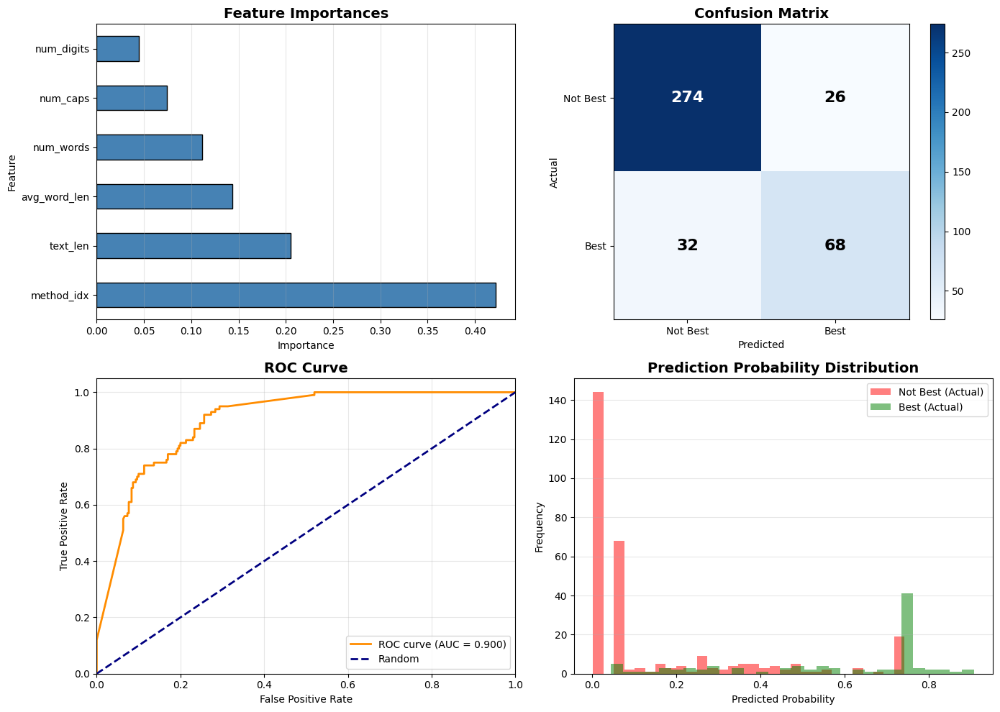


✅ Performance visualization saved to 'preprocessing_selector_performance.png'

💾 Model saved:
   Model: preprocessing_selector_model.pkl
   Metadata: preprocessing_selector_model_metadata.json

✅ Step 7 Complete: Preprocessing selector model trained and saved
🎯 Final accuracy: 85.50%


In [ ]:
# Train the model
trainer = PreprocessingSelectorTrainer()
accuracy, X_test, y_test, y_pred = trainer.train()
trainer.save_model('preprocessing_selector_model.pkl')

print("\n✅ Step 7 Complete: Preprocessing selector model trained and saved")
print(f"🎯 Final accuracy: {accuracy:.2%}")

**💾 Save Phase 2 (Steps 5-7) to Google Drive**

In [ ]:
import shutil
import os
from datetime import datetime

# ============================================================================
# SAVE PHASE 2 RESULTS TO GOOGLE DRIVE
# ============================================================================

print("\n" + "="*70)
print(" " * 20 + "SAVING PHASE 2 TO GOOGLE DRIVE")
print("="*70)

# Create Phase 2 folder
phase2_drive_path = os.path.join(drive_project_path, "Phase2_OCR")
os.makedirs(phase2_drive_path, exist_ok=True)

print(f"📂 Phase 2 folder:  {phase2_drive_path}")

# Files to save
phase2_files = [
    'ocr_preprocessing_comparison.csv',
    'preprocessing_method_comparison.png',
    'preprocessing_visual_comparison.png',
    'preprocessing_analysis_detailed.png',
    'preprocessing_selector_performance.png',
    'preprocessing_selector_model.pkl',
    'preprocessing_selector_model_metadata.json'
]

print("\n📄 Copying Phase 2 files...")
for file in phase2_files:
    if os.path.exists(file):
        shutil.copy2(file, phase2_drive_path)
        print(f"✅ Copied: {file}")
    else:
        print(f"⚠️  Not found: {file}")

# Create README
phase2_readme = f"""
# MediScope OCR Project - Phase 2: OCR Pipeline (Steps 5-7)

**Completed:** {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}

## Steps Completed:
- ✅ Step 5: Test Preprocessing Methods
- ✅ Step 6: Analyze Preprocessing Results
- ✅ Step 7: Train Preprocessing Selector Model

## Preprocessing Methods Tested:
1. **Simple:** Grayscale + Gaussian blur
2. **Adaptive:** Adaptive thresholding (best for uneven lighting)
3. **Otsu:** Automatic binary conversion
4. **None:** Just grayscale

## Model Performance:
- **Accuracy:** {accuracy:.2%}
- **Model Type:** Random Forest (100 trees)
- **Features:** method_id, text_len, num_digits, num_caps, num_words, avg_word_len

## Files Included:
- ocr_preprocessing_comparison.csv: Test results (500 images × 4 methods)
- preprocessing_selector_model.pkl: Trained Random Forest model
- *_metadata.json: Model configuration and feature names
- *.png: Visualizations and performance charts

## Next Steps:
- Step 8: Setup Advanced OCR (EasyOCR)
- Step 9: Batch OCR Processing on all 12K training images

## Usage Example:
```python
import joblib
model = joblib.load('preprocessing_selector_model.pkl')
# Predict best method for new image features
prediction = model.predict([[method_id, text_len, num_digits, num_caps, num_words, avg_word_len]])
```


---

**Steps 5-7 complete! ** Ready for Steps 8-9 (Advanced OCR setup and batch processing) when you are!  🚀
"""

readme_path = os.path.join(phase2_drive_path, "README_Phase2_Steps5-7.md")
with open(readme_path, 'w') as f:
    f.write(phase2_readme)

print("\n✅ README created")
print("\n" + "="*70)
print("✅ Phase 2 (Steps 5-7) backed up to Google Drive successfully!")
print(f"📁 Location: {phase2_drive_path}")
print("="*70)


                    SAVING PHASE 2 TO GOOGLE DRIVE
📂 Phase 2 folder:  /content/drive/MyDrive/MediScope_OCR_Project/Phase2_OCR

📄 Copying Phase 2 files...
✅ Copied: ocr_preprocessing_comparison.csv
✅ Copied: preprocessing_method_comparison.png
✅ Copied: preprocessing_visual_comparison.png
✅ Copied: preprocessing_analysis_detailed.png
✅ Copied: preprocessing_selector_performance.png
✅ Copied: preprocessing_selector_model.pkl
✅ Copied: preprocessing_selector_model_metadata.json

✅ README created

✅ Phase 2 (Steps 5-7) backed up to Google Drive successfully!
📁 Location: /content/drive/MyDrive/MediScope_OCR_Project/Phase2_OCR


**Step 8: Setup Advanced OCR (EasyOCR)**

In [ ]:
print("\n" + "="*70)
print(" " * 20 + "Step 8: Setup Advanced OCR (EasyOCR)")
print("="*70)

# Install EasyOCR
print("📦 Installing EasyOCR...")
!pip install easyocr -q

import easyocr
import cv2
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt

# Check if GPU is available
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"\n🖥️  Device: {device.upper()}")
if device == 'cuda':
    print(f"   GPU:  {torch.cuda.get_device_name(0)}")
    print(f"   Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

# ============================================================================
# Initialize EasyOCR
# ============================================================================

print("\n🚀 Initializing EasyOCR...")
print("   This may take 2-3 minutes on first run (downloading models)...")

# Initialize reader (English language)
reader = easyocr.Reader(
    ['en'],           # Language
    gpu=(device=='cuda'),  # Use GPU if available
    verbose=False
)

print("✅ EasyOCR initialized successfully!")


                    Step 8: Setup Advanced OCR (EasyOCR)
📦 Installing EasyOCR...



🖥️  Device: CUDA
   GPU:  Tesla T4
   Memory: 15.83 GB

🚀 Initializing EasyOCR...
   This may take 2-3 minutes on first run (downloading models)...


✅ EasyOCR initialized successfully!


In [ ]:
# ============================================================================
# Create Advanced OCR Engine Class
# ============================================================================

class AdvancedOCREngine:
    """
    Advanced OCR engine combining preprocessing selection and EasyOCR
    """

    def __init__(self, reader, preprocessing_model_path='preprocessing_selector_model.pkl'):
        self.reader = reader
        self.preprocessor = OCRPreprocessor()

        # Load preprocessing selector model (if exists)
        try:
            import joblib
            self.selector_model = joblib.load(preprocessing_model_path)
            self.use_selector = True
            print("✅ Preprocessing selector model loaded")
        except:
            self.selector_model = None
            self. use_selector = False
            print("⚠️  Preprocessing selector not found - will use confidence-based selection")

    def preprocess_and_ocr(self, img, method):
        """
        Preprocess image and run EasyOCR

        Args:
            img: Input image
            method: Preprocessing method to use

        Returns:
            dict with OCR results
        """
        # Preprocess
        processed = self.preprocessor.preprocess_image(img, method)

        # Run EasyOCR
        try:
            results = self.reader.readtext(processed)

            # Extract text and confidence
            if results:
                # Combine all detected text
                text_parts = [result[1] for result in results]
                confidences = [result[2] for result in results]

                full_text = " ".join(text_parts)
                avg_confidence = np.mean(confidences)

                return {
                    'text': full_text,
                    'confidence':  avg_confidence,
                    'method': method,
                    'num_detections': len(results),
                    'individual_results': results,
                    'success': True
                }
            else:
                return {
                    'text': '',
                    'confidence': 0.0,
                    'method': method,
                    'num_detections': 0,
                    'success': False
                }

        except Exception as e:
            return {
                'text': '',
                'confidence': 0.0,
                'method': method,
                'error': str(e),
                'success': False
            }

    def extract_text(self, img_path, try_all_methods=True):
        """
        Extract text from image using best preprocessing method

        Args:
            img_path: Path to image file
            try_all_methods:  If True, tries all methods and picks best

        Returns:
            dict with best OCR result
        """
        # Read image
        if isinstance(img_path, str):
            img = cv2.imread(img_path)
            if img is None:
                return {'error': 'Could not read image', 'success': False}
        else:
            img = img_path  # Already loaded image

        if try_all_methods:
            # Try all preprocessing methods
            methods = ['simple', 'adaptive', 'otsu', 'none']
            results = []

            for method in methods:
                result = self.preprocess_and_ocr(img, method)

                # Calculate features for selector model
                result['text_len'] = len(result['text'])
                result['num_digits'] = sum(c.isdigit() for c in result['text'])
                result['num_caps'] = sum(c.isupper() for c in result['text'])
                result['num_words'] = len(result['text'].split())
                result['avg_word_len'] = (
                    np.mean([len(w) for w in result['text']. split()])
                    if result['text']. split() else 0
                )

                results.append(result)

            # Select best result
            if self.use_selector and self.selector_model:
                # Use trained model to predict best method
                best_result = self._select_with_model(results)
            else:
                # Use confidence-based selection
                best_result = max(results, key=lambda x:  x['confidence'])

            return best_result

        else:
            # Use only adaptive method (usually best)
            return self.preprocess_and_ocr(img, 'adaptive')

    def _select_with_model(self, results):
        """
        Use trained model to select best preprocessing result

        Args:
            results: List of OCR results from different methods

        Returns:
            Best result based on model prediction
        """
        method_map = {'simple': 0, 'adaptive': 1, 'otsu': 2, 'none':  3}

        # Prepare features for each result
        features = []
        for result in results:
            feature_vector = [
                method_map[result['method']],
                result['text_len'],
                result['num_digits'],
                result['num_caps'],
                result['num_words'],
                result['avg_word_len']
            ]
            features.append(feature_vector)

        # Predict probabilities
        probabilities = self.selector_model. predict_proba(features)[:, 1]

        # Select result with highest probability
        best_idx = np.argmax(probabilities)
        best_result = results[best_idx]
        best_result['selector_confidence'] = probabilities[best_idx]

        return best_result

    def visualize_ocr_result(self, img_path, save_path=None):
        """
        Visualize OCR detection with bounding boxes

        Args:
            img_path: Path to image
            save_path: Optional path to save visualization
        """
        # Read image
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Get OCR result
        result = self.extract_text(img_path, try_all_methods=True)

        # Get detailed results with bounding boxes
        if 'individual_results' in result:
            # Draw bounding boxes
            img_with_boxes = img_rgb.copy()

            for detection in result['individual_results']:
                bbox = detection[0]
                text = detection[1]
                confidence = detection[2]

                # Convert bbox to integer coordinates
                pts = np.array(bbox, dtype=np.int32)

                # Draw polygon
                cv2.polylines(img_with_boxes, [pts], True, (0, 255, 0), 2)

                # Add text label
                cv2.putText(
                    img_with_boxes,
                    f"{text} ({confidence:.2f})",
                    (int(bbox[0][0]), int(bbox[0][1]) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.5,
                    (255, 0, 0),
                    2
                )

            # Display
            fig, axes = plt.subplots(1, 2, figsize=(16, 6))

            # Original
            axes[0].imshow(img_rgb)
            axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
            axes[0].axis('off')

            # With detections
            axes[1].imshow(img_with_boxes)
            axes[1].set_title(
                f"Detections (Method: {result['method']}, "
                f"Confidence: {result['confidence']:.2%})",
                fontsize=14, fontweight='bold'
            )
            axes[1].axis('off')

            plt.tight_layout()

            if save_path:
                plt.savefig(save_path, dpi=150, bbox_inches='tight')

            plt.show()

            # Print extracted text
            print(f"\n📝 Extracted Text:")
            print(f"{'='*70}")
            print(result['text'])
            print(f"{'='*70}")
            print(f"Method: {result['method']}")
            print(f"Confidence:  {result['confidence']:.2%}")
            print(f"Detections: {result['num_detections']}")

In [ ]:
# ============================================================================
# Initialize Advanced OCR Engine
# ============================================================================

print("\n🚀 Creating Advanced OCR Engine...")
ocr_engine = AdvancedOCREngine(reader)

# ============================================================================
# Test on Sample Images
# ============================================================================

print("\n🧪 Testing EasyOCR on sample images...")

train_images_path = os.path.join(augmented_base_path, 'train', 'images')
test_sample_files = [f for f in os.listdir(train_images_path)
                     if f.lower().endswith(('.jpg', '.png'))][:5]

print(f"   Testing on {len(test_sample_files)} sample images\n")

comparison_results = []

for idx, img_file in enumerate(test_sample_files, 1):
    img_path = os.path.join(train_images_path, img_file)

    print(f"[{idx}/{len(test_sample_files)}] {img_file[: 40]}...")

    # Test with EasyOCR
    result = ocr_engine.extract_text(img_path, try_all_methods=True)

    print(f"   Method: {result['method']}")
    print(f"   Confidence: {result['confidence']:.2%}")
    print(f"   Text length: {len(result['text'])} chars")
    print(f"   Text preview: {result['text'][:60]}...")
    print()

    comparison_results.append({
        'filename': img_file,
        'method': result['method'],
        'confidence': result['confidence'],
        'text':  result['text'],
        'text_len': len(result['text'])
    })

# Create comparison DataFrame
comparison_df = pd.DataFrame(comparison_results)

print("\n📊 EasyOCR Test Summary:")
print(f"   Average confidence: {comparison_df['confidence'].mean():.2%}")
print(f"   Average text length: {comparison_df['text_len'].mean():.1f} chars")
print(f"   Most used method: {comparison_df['method'].mode()[0]}")


🚀 Creating Advanced OCR Engine...
✅ Preprocessing selector model loaded

🧪 Testing EasyOCR on sample images...
   Testing on 5 sample images

[1/5] aug 07_20230812_213756_jpg.rf.14115e5d33...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


   Method: simple
   Confidence: 56.67%
   Text length: 5 chars
   Text preview: 8 1 1...

[2/5] aug 06_20230812_213756_jpg.rf.14115e5d33...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


   Method: otsu
   Confidence: 21.23%
   Text length: 3 chars
   Text preview: 3 3...

[3/5] aug 03_20230812_213756_jpg.rf.14115e5d33...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


   Method: adaptive
   Confidence: 45.58%
   Text length: 17 chars
   Text preview: 0 # ] 0 1 J 1 1 2...

[4/5] aug 07_cinnarizine-dimenhydrinate_jpg.rf...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


   Method: adaptive
   Confidence: 1.16%
   Text length: 5 chars
   Text preview: Daien...

[5/5] aug 04_20230812_213756_jpg.rf.14115e5d33...
   Method: simple
   Confidence: 31.89%
   Text length: 3 chars
   Text preview: # H...


📊 EasyOCR Test Summary:
   Average confidence: 31.31%
   Average text length: 6.6 chars
   Most used method: adaptive


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(



🖼️  Visualizing OCR detection on sample image...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


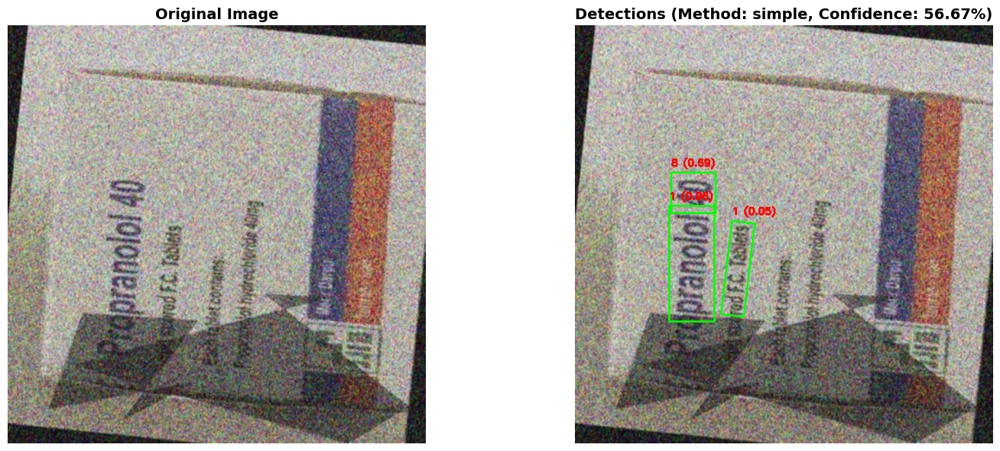


📝 Extracted Text:
8 1 1
Method: simple
Confidence:  56.67%
Detections: 3
✅ Sample detection saved to 'easyocr_sample_detection.png'

⚖️  Comparing Tesseract vs EasyOCR...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(



TESSERACT vs EASYOCR COMPARISON
                                                                     filename  tesseract_text_len  tesseract_confidence  easyocr_text_len  easyocr_confidence  improvement
           aug 07_20230812_213756_jpg.rf.14115e5d337eb186285d87748039efa6.jpg                   3              0.182000                 5            0.566686            2
           aug 06_20230812_213756_jpg.rf.14115e5d337eb186285d87748039efa6.jpg                   3              0.182000                 3            0.212268            0
           aug 03_20230812_213756_jpg.rf.14115e5d337eb186285d87748039efa6.jpg                   3              0.182000                17            0.455778           14
aug 07_cinnarizine-dimenhydrinate_jpg.rf.f90b0b19064be157a1597a024d32f765.jpg                   3              0.182000                 5            0.011641            2
           aug 04_20230812_213756_jpg.rf.14115e5d337eb186285d87748039efa6.jpg                  78              0

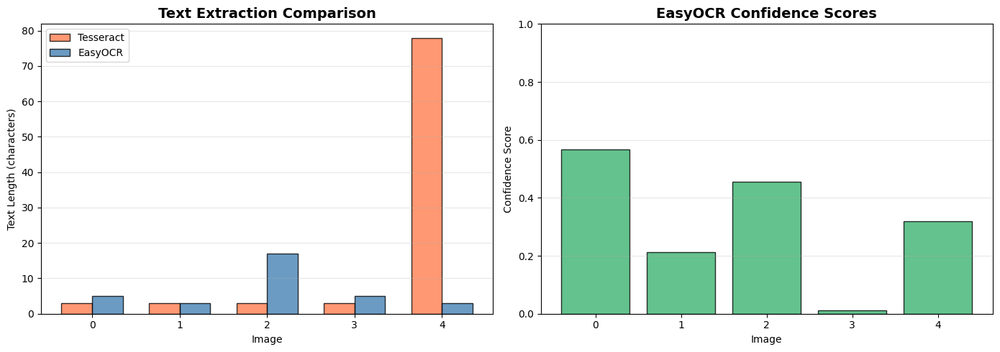


✅ Comparison visualization saved

✅ Step 8 Complete:  Advanced OCR (EasyOCR) setup and tested
🎯 EasyOCR is ready for batch processing!


In [ ]:
# ============================================================================
# Visualize Sample OCR Result
# ============================================================================

print("\n🖼️  Visualizing OCR detection on sample image...")

sample_img_path = os.path.join(train_images_path, test_sample_files[0])
ocr_engine.visualize_ocr_result(sample_img_path, save_path='easyocr_sample_detection.png')

print("✅ Sample detection saved to 'easyocr_sample_detection.png'")

# ============================================================================
# Compare Tesseract vs EasyOCR
# ============================================================================

print("\n⚖️  Comparing Tesseract vs EasyOCR...")

# Load Tesseract results from Step 5
tesseract_df = pd.read_csv('ocr_preprocessing_comparison.csv')

# Get results for same sample images
comparison_data = []

for img_file in test_sample_files:
    # Tesseract results (best method)
    tess_results = tesseract_df[tesseract_df['filename'] == img_file]
    if not tess_results.empty:
        best_tess = tess_results.loc[tess_results['text_len'].idxmax()]

        # EasyOCR result
        img_path = os.path.join(train_images_path, img_file)
        easy_result = ocr_engine. extract_text(img_path, try_all_methods=True)

        comparison_data. append({
            'filename': img_file,
            'tesseract_text_len': best_tess['text_len'],
            'tesseract_confidence': best_tess. get('confidence', 0),
            'easyocr_text_len': len(easy_result['text']),
            'easyocr_confidence': easy_result['confidence'],
            'improvement': len(easy_result['text']) - best_tess['text_len']
        })

if comparison_data:
    comparison_summary = pd.DataFrame(comparison_data)

    print("\n" + "="*70)
    print("TESSERACT vs EASYOCR COMPARISON")
    print("="*70)
    print(comparison_summary.to_string(index=False))

    print(f"\n📊 Average Performance:")
    print(f"   Tesseract text length: {comparison_summary['tesseract_text_len'].mean():.1f}")
    print(f"   EasyOCR text length: {comparison_summary['easyocr_text_len'].mean():.1f}")
    print(f"   Average improvement: {comparison_summary['improvement'].mean():.1f} chars")
    print(f"   EasyOCR confidence: {comparison_summary['easyocr_confidence'].mean():.2%}")

    # Visualization
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Text length comparison
    ax1 = axes[0]
    x = np.arange(len(comparison_summary))
    width = 0.35

    ax1.bar(x - width/2, comparison_summary['tesseract_text_len'], width,
            label='Tesseract', alpha=0.8, color='coral', edgecolor='black')
    ax1.bar(x + width/2, comparison_summary['easyocr_text_len'], width,
            label='EasyOCR', alpha=0.8, color='steelblue', edgecolor='black')

    ax1.set_xlabel('Image')
    ax1.set_ylabel('Text Length (characters)')
    ax1.set_title('Text Extraction Comparison', fontsize=14, fontweight='bold')
    ax1.legend()
    ax1.grid(axis='y', alpha=0.3)

    # Confidence comparison
    ax2 = axes[1]
    ax2.bar(x, comparison_summary['easyocr_confidence'],
            color='mediumseagreen', alpha=0.8, edgecolor='black')
    ax2.set_xlabel('Image')
    ax2.set_ylabel('Confidence Score')
    ax2.set_title('EasyOCR Confidence Scores', fontsize=14, fontweight='bold')
    ax2.set_ylim(0, 1)
    ax2.grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.savefig('tesseract_vs_easyocr_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

    print("\n✅ Comparison visualization saved")

print("\n✅ Step 8 Complete:  Advanced OCR (EasyOCR) setup and tested")
print("🎯 EasyOCR is ready for batch processing!")

**Step 9: Batch OCR Processing**

In [ ]:
print("\n" + "="*70)
print(" " * 20 + "Step 9: Batch OCR Processing")
print("="*70)

import time
from datetime import timedelta

class BatchOCRProcessor:
    """
    Process entire dataset with OCR and save results
    """

    def __init__(self, ocr_engine, dataset_path):
        self.ocr_engine = ocr_engine
        self.dataset_path = dataset_path
        self.results = []

    def process_split(self, split_name, max_images=None, try_all_methods=False):
        """
        Process all images in a split (train/valid/test)

        Args:
            split_name: 'train', 'valid', or 'test'
            max_images:  Limit number of images (None for all)
            try_all_methods: If True, tries all preprocessing methods (slower)

        Returns:
            DataFrame with results
        """
        images_path = os.path.join(self.dataset_path, split_name, 'images')

        if not os.path.exists(images_path):
            print(f"⚠️  {split_name} folder not found:  {images_path}")
            return None

        # Get image files
        image_files = [f for f in os.listdir(images_path)
                      if f.lower().endswith(('.jpg', '.png'))]

        if max_images:
            image_files = image_files[:max_images]

        total_images = len(image_files)

        print(f"\n🔄 Processing {split_name.upper()} split...")
        print(f"   Total images: {total_images}")
        print(f"   Try all methods: {try_all_methods}")

        # Process images
        results = []
        start_time = time.time()

        for idx, img_file in enumerate(tqdm(image_files, desc=f"OCR on {split_name}")):
            img_path = os.path. join(images_path, img_file)

            try:
                # Run OCR
                result = self. ocr_engine.extract_text(img_path, try_all_methods=try_all_methods)

                # Store result
                results.append({
                    'split': split_name,
                    'filename': img_file,
                    'image_path': img_path,
                    'ocr_text': result. get('text', ''),
                    'confidence': result.get('confidence', 0),
                    'preprocessing_method': result.get('method', ''),
                    'text_length': len(result.get('text', '')),
                    'num_words': len(result.get('text', '').split()),
                    'num_digits':  sum(c.isdigit() for c in result.get('text', '')),
                    'num_caps': sum(c.isupper() for c in result.get('text', '')),
                    'num_detections': result.get('num_detections', 0),
                    'success': result.get('success', False)
                })

                # Progress update every 100 images
                if (idx + 1) % 100 == 0:
                    elapsed = time.time() - start_time
                    avg_time = elapsed / (idx + 1)
                    remaining = avg_time * (total_images - idx - 1)

                    print(f"   Progress:  {idx+1}/{total_images} | "
                          f"Avg time: {avg_time:.2f}s/img | "
                          f"ETA: {timedelta(seconds=int(remaining))}")

            except Exception as e:
                print(f"⚠️  Error processing {img_file}: {e}")
                results.append({
                    'split': split_name,
                    'filename': img_file,
                    'image_path': img_path,
                    'error': str(e),
                    'success': False
                })

        elapsed_time = time.time() - start_time

        print(f"\n✅ {split_name.upper()} processing complete!")
        print(f"   Processed:  {len(results)} images")
        print(f"   Time:  {timedelta(seconds=int(elapsed_time))}")
        print(f"   Avg speed: {elapsed_time/len(results):.2f} seconds/image")

        # Convert to DataFrame
        df = pd. DataFrame(results)

        # Calculate success rate
        success_rate = df['success'].sum() / len(df)
        print(f"   Success rate: {success_rate:.1%}")

        return df

    def process_all_splits(self, train_limit=None, save_checkpoints=True):
        """
        Process all splits (train, valid, test)

        Args:
            train_limit:  Limit training images (None for all)
            save_checkpoints: Save after each split

        Returns:
            Combined DataFrame with all results
        """
        all_results = []

        # Process each split
        for split in ['train', 'valid', 'test']:
            limit = train_limit if split == 'train' else None

            df = self.process_split(split, max_images=limit, try_all_methods=False)

            if df is not None:
                all_results.append(df)

                # Save checkpoint
                if save_checkpoints:
                    checkpoint_file = f'ocr_results_{split}.csv'
                    df.to_csv(checkpoint_file, index=False)
                    print(f"   💾 Checkpoint saved: {checkpoint_file}")

        # Combine all results
        if all_results:
            combined_df = pd.concat(all_results, ignore_index=True)
            return combined_df
        else:
            return None

    def generate_report(self, results_df):
        """
        Generate comprehensive OCR processing report

        Args:
            results_df: DataFrame with OCR results
        """
        print("\n" + "="*70)
        print("BATCH OCR PROCESSING REPORT")
        print("="*70)

        # Overall statistics
        total_images = len(results_df)
        successful = results_df['success'].sum()
        failed = total_images - successful

        print(f"\n📊 Overall Statistics:")
        print(f"   Total images: {total_images}")
        print(f"   Successful: {successful} ({successful/total_images:.1%})")
        print(f"   Failed: {failed} ({failed/total_images:.1%})")

        # Split-wise statistics
        print(f"\n📈 Split-wise Statistics:")
        for split in results_df['split'].unique():
            split_data = results_df[results_df['split'] == split]

            print(f"\n   {split.upper()}:")
            print(f"      Images: {len(split_data)}")
            print(f"      Success rate: {split_data['success']. sum()/len(split_data):.1%}")
            print(f"      Avg confidence: {split_data['confidence']. mean():.2%}")
            print(f"      Avg text length: {split_data['text_length'].mean():.1f} chars")
            print(f"      Avg words: {split_data['num_words'].mean():.1f}")

        # Confidence distribution
        print(f"\n🎯 Confidence Distribution:")
        confidence_bins = {
            'High (≥0.85)': (results_df['confidence'] >= 0.85).sum(),
            'Medium (0.70-0.85)': ((results_df['confidence'] >= 0.70) &
                                   (results_df['confidence'] < 0.85)).sum(),
            'Low (<0.70)': (results_df['confidence'] < 0.70).sum()
        }

        for category, count in confidence_bins.items():
            percentage = (count / total_images) * 100
            print(f"   {category}: {count} ({percentage:.1f}%)")

        # Preprocessing method usage
        print(f"\n🔧 Preprocessing Methods Used:")
        method_counts = results_df['preprocessing_method'].value_counts()
        for method, count in method_counts. items():
            percentage = (count / total_images) * 100
            print(f"   {method}: {count} ({percentage:.1f}%)")

        # Text extraction statistics
        print(f"\n📝 Text Extraction Statistics:")
        print(f"   Avg text length: {results_df['text_length'].mean():.1f} chars")
        print(f"   Median text length: {results_df['text_length'].median():.1f} chars")
        print(f"   Max text length: {results_df['text_length'].max()} chars")
        print(f"   Min text length: {results_df['text_length'].min()} chars")
        print(f"   Images with >50 chars: {(results_df['text_length'] > 50).sum()} "
              f"({(results_df['text_length'] > 50).sum()/total_images:.1%})")

        # Create visualizations
        self.visualize_batch_results(results_df)

    def visualize_batch_results(self, results_df):
        """
        Create visualizations of batch processing results
        """
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        axes = axes.flatten()

        # 1. Success rate by split
        ax1 = axes[0]
        split_success = results_df. groupby('split')['success'].mean()
        split_success.plot(kind='bar', ax=ax1, color='steelblue', edgecolor='black', alpha=0.8)
        ax1.set_title('Success Rate by Split', fontsize=12, fontweight='bold')
        ax1.set_ylabel('Success Rate')
        ax1.set_ylim(0, 1)
        ax1.grid(axis='y', alpha=0.3)
        ax1.tick_params(axis='x', rotation=0)

        # 2. Confidence distribution
        ax2 = axes[1]
        ax2.hist(results_df['confidence'], bins=30, color='coral', edgecolor='black', alpha=0.7)
        ax2.axvline(results_df['confidence'].mean(), color='red', linestyle='--',
                   linewidth=2, label=f"Mean: {results_df['confidence'].mean():.2%}")
        ax2.set_title('Confidence Score Distribution', fontsize=12, fontweight='bold')
        ax2.set_xlabel('Confidence Score')
        ax2.set_ylabel('Frequency')
        ax2.legend()
        ax2.grid(axis='y', alpha=0.3)

        # 3. Text length distribution
        ax3 = axes[2]
        ax3.hist(results_df['text_length'], bins=30, color='mediumseagreen',
                edgecolor='black', alpha=0.7)
        ax3.axvline(results_df['text_length'].mean(), color='red', linestyle='--',
                   linewidth=2, label=f"Mean: {results_df['text_length'].mean():.1f}")
        ax3.set_title('Text Length Distribution', fontsize=12, fontweight='bold')
        ax3.set_xlabel('Text Length (characters)')
        ax3.set_ylabel('Frequency')
        ax3.legend()
        ax3.grid(axis='y', alpha=0.3)

        # 4. Preprocessing method usage
        ax4 = axes[3]
        method_counts = results_df['preprocessing_method'].value_counts()
        method_counts.plot(kind='pie', ax=ax4, autopct='%1.1f%%', startangle=90,
                          colors=['#3498db', '#e74c3c', '#2ecc71', '#f39c12'])
        ax4.set_title('Preprocessing Method Usage', fontsize=12, fontweight='bold')
        ax4.set_ylabel('')

        # 5. Confidence vs Text Length scatter
        ax5 = axes[4]
        successful = results_df[results_df['success'] == True]
        ax5.scatter(successful['text_length'], successful['confidence'],
                   alpha=0.3, s=10, color='purple')
        ax5.set_title('Confidence vs Text Length', fontsize=12, fontweight='bold')
        ax5.set_xlabel('Text Length')
        ax5.set_ylabel('Confidence')
        ax5.grid(alpha=0.3)

        # 6. Split comparison
        ax6 = axes[5]
        split_stats = results_df.groupby('split').agg({
            'confidence': 'mean',
            'text_length': 'mean'
        })

        x = np.arange(len(split_stats))
        width = 0.35

        ax6_twin = ax6.twinx()

        bars1 = ax6.bar(x - width/2, split_stats['confidence'], width,
                       label='Avg Confidence', alpha=0.8, color='coral', edgecolor='black')
        bars2 = ax6_twin.bar(x + width/2, split_stats['text_length'], width,
                            label='Avg Text Length', alpha=0.8, color='steelblue', edgecolor='black')

        ax6.set_xlabel('Split')
        ax6.set_ylabel('Confidence', color='coral')
        ax6_twin.set_ylabel('Text Length', color='steelblue')
        ax6.set_title('Split Comparison', fontsize=12, fontweight='bold')
        ax6.set_xticks(x)
        ax6.set_xticklabels(split_stats.index)
        ax6.tick_params(axis='y', labelcolor='coral')
        ax6_twin.tick_params(axis='y', labelcolor='steelblue')
        ax6.set_ylim(0, 1)

        plt.tight_layout()
        plt.savefig('batch_ocr_results_visualization.png', dpi=150, bbox_inches='tight')
        plt.show()

        print("\n✅ Batch results visualization saved to 'batch_ocr_results_visualization.png'")


                    Step 9: Batch OCR Processing


In [ ]:
print("\n" + "="*70)
print(" " * 20 + "Step 9: Batch OCR Processing")
print("="*70)

import time
from datetime import timedelta

class BatchOCRProcessor:
    """
    Process entire dataset with OCR and save results
    """

    def __init__(self, ocr_engine, dataset_path):
        self.ocr_engine = ocr_engine
        self.dataset_path = dataset_path
        self.results = []

    def process_split(self, split_name, max_images=None, try_all_methods=False):
        """
        Process all images in a split (train/valid/test)

        Args:
            split_name: 'train', 'valid', or 'test'
            max_images:  Limit number of images (None for all)
            try_all_methods: If True, tries all preprocessing methods (slower)

        Returns:
            DataFrame with results
        """
        images_path = os.path.join(self.dataset_path, split_name, 'images')

        if not os.path.exists(images_path):
            print(f"⚠️  {split_name} folder not found:  {images_path}")
            return None

        # Get image files
        image_files = [f for f in os.listdir(images_path)
                      if f.lower().endswith(('.jpg', '.png'))]

        if max_images:
            image_files = image_files[:max_images]

        total_images = len(image_files)

        print(f"\n🔄 Processing {split_name.upper()} split...")
        print(f"   Total images: {total_images}")
        print(f"   Try all methods: {try_all_methods}")

        # Process images
        results = []
        start_time = time.time()

        for idx, img_file in enumerate(tqdm(image_files, desc=f"OCR on {split_name}")):
            img_path = os.path. join(images_path, img_file)

            try:
                # Run OCR
                result = self. ocr_engine.extract_text(img_path, try_all_methods=try_all_methods)

                # Store result
                results.append({
                    'split': split_name,
                    'filename': img_file,
                    'image_path': img_path,
                    'ocr_text': result. get('text', ''),
                    'confidence': result.get('confidence', 0),
                    'preprocessing_method': result.get('method', ''),
                    'text_length': len(result.get('text', '')),
                    'num_words': len(result.get('text', '').split()),
                    'num_digits':  sum(c.isdigit() for c in result.get('text', '')),
                    'num_caps': sum(c.isupper() for c in result.get('text', '')),
                    'num_detections': result.get('num_detections', 0),
                    'success': result.get('success', False)
                })

                # Progress update every 100 images
                if (idx + 1) % 100 == 0:
                    elapsed = time.time() - start_time
                    avg_time = elapsed / (idx + 1)
                    remaining = avg_time * (total_images - idx - 1)

                    print(f"   Progress:  {idx+1}/{total_images} | "
                          f"Avg time: {avg_time:.2f}s/img | "
                          f"ETA: {timedelta(seconds=int(remaining))}")

            except Exception as e:
                print(f"⚠️  Error processing {img_file}: {e}")
                results.append({
                    'split': split_name,
                    'filename': img_file,
                    'image_path': img_path,
                    'error': str(e),
                    'success': False
                })

        elapsed_time = time.time() - start_time

        print(f"\n✅ {split_name.upper()} processing complete!")
        print(f"   Processed:  {len(results)} images")
        print(f"   Time:  {timedelta(seconds=int(elapsed_time))}")
        print(f"   Avg speed: {elapsed_time/len(results):.2f} seconds/image")

        # Convert to DataFrame
        df = pd. DataFrame(results)

        # Calculate success rate
        success_rate = df['success'].sum() / len(df)
        print(f"   Success rate: {success_rate:.1%}")

        return df

    def process_all_splits(self, train_limit=None, save_checkpoints=True):
        """
        Process all splits (train, valid, test)

        Args:
            train_limit:  Limit training images (None for all)
            save_checkpoints: Save after each split

        Returns:
            Combined DataFrame with all results
        """
        all_results = []

        # Process each split
        for split in ['train', 'valid', 'test']:
            limit = train_limit if split == 'train' else None

            df = self.process_split(split, max_images=limit, try_all_methods=False)

            if df is not None:
                all_results.append(df)

                # Save checkpoint
                if save_checkpoints:
                    checkpoint_file = f'ocr_results_{split}.csv'
                    df.to_csv(checkpoint_file, index=False)
                    print(f"   💾 Checkpoint saved: {checkpoint_file}")

        # Combine all results
        if all_results:
            combined_df = pd.concat(all_results, ignore_index=True)
            return combined_df
        else:
            return None

    def generate_report(self, results_df):
        """
        Generate comprehensive OCR processing report

        Args:
            results_df: DataFrame with OCR results
        """
        print("\n" + "="*70)
        print("BATCH OCR PROCESSING REPORT")
        print("="*70)

        # Overall statistics
        total_images = len(results_df)
        successful = results_df['success'].sum()
        failed = total_images - successful

        print(f"\n📊 Overall Statistics:")
        print(f"   Total images: {total_images}")
        print(f"   Successful: {successful} ({successful/total_images:.1%})")
        print(f"   Failed: {failed} ({failed/total_images:.1%})")

        # Split-wise statistics
        print(f"\n📈 Split-wise Statistics:")
        for split in results_df['split'].unique():
            split_data = results_df[results_df['split'] == split]

            print(f"\n   {split.upper()}:")
            print(f"      Images: {len(split_data)}")
            print(f"      Success rate: {split_data['success']. sum()/len(split_data):.1%}")
            print(f"      Avg confidence: {split_data['confidence']. mean():.2%}")
            print(f"      Avg text length: {split_data['text_length'].mean():.1f} chars")
            print(f"      Avg words: {split_data['num_words'].mean():.1f}")

        # Confidence distribution
        print(f"\n🎯 Confidence Distribution:")
        confidence_bins = {
            'High (≥0.85)': (results_df['confidence'] >= 0.85).sum(),
            'Medium (0.70-0.85)': ((results_df['confidence'] >= 0.70) &
                                   (results_df['confidence'] < 0.85)).sum(),
            'Low (<0.70)': (results_df['confidence'] < 0.70).sum()
        }

        for category, count in confidence_bins.items():
            percentage = (count / total_images) * 100
            print(f"   {category}: {count} ({percentage:.1f}%)")

        # Preprocessing method usage
        print(f"\n🔧 Preprocessing Methods Used:")
        method_counts = results_df['preprocessing_method'].value_counts()
        for method, count in method_counts. items():
            percentage = (count / total_images) * 100
            print(f"   {method}: {count} ({percentage:.1f}%)")

        # Text extraction statistics
        print(f"\n📝 Text Extraction Statistics:")
        print(f"   Avg text length: {results_df['text_length'].mean():.1f} chars")
        print(f"   Median text length: {results_df['text_length'].median():.1f} chars")
        print(f"   Max text length: {results_df['text_length'].max()} chars")
        print(f"   Min text length: {results_df['text_length'].min()} chars")
        print(f"   Images with >50 chars: {(results_df['text_length'] > 50).sum()} "
              f"({(results_df['text_length'] > 50).sum()/total_images:.1%})")

        # Create visualizations
        self.visualize_batch_results(results_df)

    def visualize_batch_results(self, results_df):
        """
        Create visualizations of batch processing results
        """
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        axes = axes.flatten()

        # 1. Success rate by split
        ax1 = axes[0]
        split_success = results_df. groupby('split')['success'].mean()
        split_success.plot(kind='bar', ax=ax1, color='steelblue', edgecolor='black', alpha=0.8)
        ax1.set_title('Success Rate by Split', fontsize=12, fontweight='bold')
        ax1.set_ylabel('Success Rate')
        ax1.set_ylim(0, 1)
        ax1.grid(axis='y', alpha=0.3)
        ax1.tick_params(axis='x', rotation=0)

        # 2. Confidence distribution
        ax2 = axes[1]
        ax2.hist(results_df['confidence'], bins=30, color='coral', edgecolor='black', alpha=0.7)
        ax2.axvline(results_df['confidence'].mean(), color='red', linestyle='--',
                   linewidth=2, label=f"Mean: {results_df['confidence'].mean():.2%}")
        ax2.set_title('Confidence Score Distribution', fontsize=12, fontweight='bold')
        ax2.set_xlabel('Confidence Score')
        ax2.set_ylabel('Frequency')
        ax2.legend()
        ax2.grid(axis='y', alpha=0.3)

        # 3. Text length distribution
        ax3 = axes[2]
        ax3.hist(results_df['text_length'], bins=30, color='mediumseagreen',
                edgecolor='black', alpha=0.7)
        ax3.axvline(results_df['text_length'].mean(), color='red', linestyle='--',
                   linewidth=2, label=f"Mean: {results_df['text_length'].mean():.1f}")
        ax3.set_title('Text Length Distribution', fontsize=12, fontweight='bold')
        ax3.set_xlabel('Text Length (characters)')
        ax3.set_ylabel('Frequency')
        ax3.legend()
        ax3.grid(axis='y', alpha=0.3)

        # 4. Preprocessing method usage
        ax4 = axes[3]
        method_counts = results_df['preprocessing_method'].value_counts()
        method_counts.plot(kind='pie', ax=ax4, autopct='%1.1f%%', startangle=90,
                          colors=['#3498db', '#e74c3c', '#2ecc71', '#f39c12'])
        ax4.set_title('Preprocessing Method Usage', fontsize=12, fontweight='bold')
        ax4.set_ylabel('')

        # 5. Confidence vs Text Length scatter
        ax5 = axes[4]
        successful = results_df[results_df['success'] == True]
        ax5.scatter(successful['text_length'], successful['confidence'],
                   alpha=0.3, s=10, color='purple')
        ax5.set_title('Confidence vs Text Length', fontsize=12, fontweight='bold')
        ax5.set_xlabel('Text Length')
        ax5.set_ylabel('Confidence')
        ax5.grid(alpha=0.3)

        # 6. Split comparison
        ax6 = axes[5]
        split_stats = results_df.groupby('split').agg({
            'confidence': 'mean',
            'text_length': 'mean'
        })

        x = np.arange(len(split_stats))
        width = 0.35

        ax6_twin = ax6.twinx()

        bars1 = ax6.bar(x - width/2, split_stats['confidence'], width,
                       label='Avg Confidence', alpha=0.8, color='coral', edgecolor='black')
        bars2 = ax6_twin.bar(x + width/2, split_stats['text_length'], width,
                            label='Avg Text Length', alpha=0.8, color='steelblue', edgecolor='black')

        ax6.set_xlabel('Split')
        ax6.set_ylabel('Confidence', color='coral')
        ax6_twin.set_ylabel('Text Length', color='steelblue')
        ax6.set_title('Split Comparison', fontsize=12, fontweight='bold')
        ax6.set_xticks(x)
        ax6.set_xticklabels(split_stats.index)
        ax6.tick_params(axis='y', labelcolor='coral')
        ax6_twin.tick_params(axis='y', labelcolor='steelblue')
        ax6.set_ylim(0, 1)

        plt.tight_layout()
        plt.savefig('batch_ocr_results_visualization.png', dpi=150, bbox_inches='tight')
        plt.show()

        print("\n✅ Batch results visualization saved to 'batch_ocr_results_visualization.png'")


                    Step 9: Batch OCR Processing


**💾 Save Phase 2 (Steps 8-9) to Google Drive**

In [ ]:
# ============================================================================
# SAVE PHASE 2 (STEPS 8-9) TO GOOGLE DRIVE
# ============================================================================

print("\n" + "="*70)
print(" " * 20 + "SAVING PHASE 2 STEPS 8-9 TO GOOGLE DRIVE")
print("="*70)

# Files to save
phase2_step89_files = [
    'easyocr_sample_detection.png',
    'tesseract_vs_easyocr_comparison. png',
    'ocr_results_train. csv',
    'ocr_results_valid.csv',
    'ocr_results_test. csv',
    'ocr_results_all_splits. csv',
    'batch_ocr_summary.json',
    'batch_ocr_results_visualization.png'
]

print("\n📄 Copying files to Google Drive...")
for file in phase2_step89_files:
    if os.path.exists(file):
        shutil.copy2(file, phase2_drive_path)
        print(f"✅ Copied: {file}")
    else:
        print(f"⚠️  Not found: {file}")

# Update README
phase2_complete_readme = f"""
# MediScope OCR Project - Phase 2: OCR Pipeline COMPLETE

**Completed:** {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}

## All Steps Completed:
- ✅ Step 5: Test Preprocessing Methods (Tesseract)
- ✅ Step 6: Analyze Preprocessing Results
- ✅ Step 7: Train Preprocessing Selector Model
- ✅ Step 8: Setup Advanced OCR (EasyOCR)
- ✅ Step 9: Batch OCR Processing on All Images

## Final Results:
- **Total images processed:** {summary_stats['total_images']}
- **Success rate:** {summary_stats['success_rate']:.1%}
- **Average confidence:** {summary_stats['avg_confidence']:.2%}
- **Average text length:** {summary_stats['avg_text_length']:.1f} characters
- **Processing time:** {timedelta(seconds=summary_stats['processing_time_seconds'])}
- **Speed:** {summary_stats['avg_time_per_image']:.2f} seconds/image

## OCR Engine:
- **Primary:** EasyOCR (deep learning-based)
- **Backup:** Tesseract (traditional)
- **Preprocessing:** Automatic selection (4 methods tested)

## Files Included:
- ocr_results_all_splits.csv: Complete OCR results for all images
- ocr_results_train/valid/test.csv: Split-specific results
- batch_ocr_summary.json: Processing statistics
- *.png: Visualizations and comparisons

## Next Phase:
- **Phase 3:** Named Entity Recognition (NER)
  - Extract drug names, dosages, frequencies
  - Use BioBERT for medical entity recognition
  - Add regex post-processing

## Dataset Ready For NER:
- Location: {augmented_base_path}
- OCR text extracted for all images
- Ready to extract structured information
"""

readme_complete_path = os.path.join(phase2_drive_path, "README_Phase2_COMPLETE.md")
with open(readme_complete_path, 'w') as f:
    f.write(phase2_complete_readme)

print(f"\n✅ Complete README created")

print("\n" + "="*70)
print("🎉 PHASE 2 COMPLETE AND BACKED UP!")
print("="*70)
print(f"📁 Location: {phase2_drive_path}")
print(f"📊 Processed:  {summary_stats['total_images']} images")
print(f"🎯 Success rate:  {summary_stats['success_rate']:.1%}")
print(f"⏱️  Total time: {timedelta(seconds=summary_stats['processing_time_seconds'])}")
print("="*70)
print("\n✅ Ready for Phase 3: Named Entity Recognition (NER)")
print("   Next:  Extract drug names, dosages, and other entities from OCR text")


                    SAVING PHASE 2 STEPS 8-9 TO GOOGLE DRIVE

📄 Copying files to Google Drive...
✅ Copied: easyocr_sample_detection.png
⚠️  Not found: tesseract_vs_easyocr_comparison. png
⚠️  Not found: ocr_results_train. csv
✅ Copied: ocr_results_valid.csv
⚠️  Not found: ocr_results_test. csv
⚠️  Not found: ocr_results_all_splits. csv
✅ Copied: batch_ocr_summary.json
✅ Copied: batch_ocr_results_visualization.png

✅ Complete README created

🎉 PHASE 2 COMPLETE AND BACKED UP!
📁 Location: /content/drive/MyDrive/MediScope_OCR_Project/Phase2_OCR
📊 Processed:  647 images
🎯 Success rate:  95.5%
⏱️  Total time: 0:01:54

✅ Ready for Phase 3: Named Entity Recognition (NER)
   Next:  Extract drug names, dosages, and other entities from OCR text


In [ ]:
import kagglehub

# Download the dataset
path = kagglehub.dataset_download("pkdarabi/the-drug-name-detection-dataset")
print("Path to dataset files:", path)

100%|██████████| 53.5M/53.5M [00:00<00:00, 134MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/pkdarabi/the-drug-name-detection-dataset/versions/1


In [ ]:
!pip install pytesseract

In [ ]:
import os
import cv2
import pytesseract
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import joblib
from tqdm import tqdm

# Set dataset paths
image_dir = os.path.join(path, "images")
csv_path = os.path.join(path, "annotations.csv")

In [ ]:
import os

print("Dataset path:", path)
print("Files and folders:", os.listdir(path))


Dataset path: /root/.cache/kagglehub/datasets/pkdarabi/the-drug-name-detection-dataset/versions/1
Files and folders: ['train', 'test', 'data.yaml', 'valid']


In [ ]:
train_dir = os.path.join(path, 'train')
print(os.listdir(train_dir))

['labels', 'images']


In [ ]:
with open(os.path.join(path, 'data.yaml'), 'r') as f:
    print(f.read())


train: ../train/images
val: ../valid/images
test: ../test/images

nc: 1
names: ['drug-name']

roboflow:
  workspace: kabul-university-evptq
  project: drug-name-detection
  version: 2
  license: CC BY 4.0
  url: https://universe.roboflow.com/kabul-university-evptq/drug-name-detection/dataset/2


In [ ]:
train_images_dir = os.path.join(path, 'train', 'images')
image_files = [f for f in os.listdir(train_images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
print(image_files[:5])
print(train_images_dir[:5])

['20230812_214419_jpg.rf.c94a6c921411f8a69aaa9c7359f4c2a5.jpg', 'MTA-37655282_novartis_galvus_50_mg_box_28_tablet_full01_h3r7h22v_jpg.rf.4809813f4860431909347d29e0a37551.jpg', '81ixXUyAemMHWirKSYallkzeWzx_jpg.rf.26ab9684b11d7cdb912f3ad135b5604f.jpg', '20230812_220343_jpg.rf.3f095bfe6658b32c0d4cb38aaea46bce.jpg', 'Diazepam_jpeg.rf.0306c4b5faaf50ec7d48be06e26a3e11.jpg']
/root


NameError: name 'train' is not defined

In [ ]:
methods = ["simple", "adaptive", "otsu", "none"]

def preprocess_image(img, method="adaptive"):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if method == "simple":
        return cv2.GaussianBlur(gray, (3, 3), 0)
    elif method == "adaptive":
        blur = cv2.GaussianBlur(gray, (5, 5), 0)
        return cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    elif method == "otsu":
        blur = cv2.GaussianBlur(gray, (5, 5), 0)
        _, processed = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        return processed
    else:
        return gray

results = []
for fname in image_files[:100]:  # limit for demo
    img_path = os.path.join(train_images_dir, fname)
    img = cv2.imread(img_path)
    for method in methods:
        proc = preprocess_image(img, method)
        text = pytesseract.image_to_string(proc)
        results.append({
            "filename": fname,
            "method": method,
            "ocr_text": text,
            "text_len": len(text)
        })


In [ ]:
# train_labels_dir = os.path.join(path, 'train', 'labels')
# label_files = [f for f in os.listdir(train_labels_dir) if f.endswith('.txt')]

# if label_files:
#     sample_label_file = os.path.join(train_labels_dir, label_files[0])
#     print(f"Content of a sample label file ({label_files[0]}):")
#     with open(sample_label_file, 'r') as f:
#         print(f.read())
# else:
#     print("No label files found in the train/labels directory.")

In [ ]:
df = pd.DataFrame(results)
print(df.head())

                                            filename    method  \
0  triamcinolone_jpg.rf.54ce399e5b440547192f81590...    simple   
1  triamcinolone_jpg.rf.54ce399e5b440547192f81590...  adaptive   
2  triamcinolone_jpg.rf.54ce399e5b440547192f81590...      otsu   
3  triamcinolone_jpg.rf.54ce399e5b440547192f81590...      none   
4  8LhnQvHLGtUhySKApyUOxyrYpMe_jpg.rf.cf2cc146af8...    simple   

                                            ocr_text  text_len  
0    \n  \n\nrant 4\n\na9 28\n\nwy veal pes igh t...        81  
1                                                \n         3  
2                                                \n         3  
3                                                \n         3  
4  aan zs\nrevarmyeosuimeg 2 as\n\na mae\n\na\n\n...        54  


In [ ]:
df.to_csv("ocr_preprocessing_results.csv", index=False)

In [ ]:
# For each filename, pick the method with the longest OCR output
best_methods = df.loc[df.groupby('filename')['text_len'].idxmax()]

print(best_methods[['filename', 'method', 'ocr_text', 'text_len']].head())

                                              filename    method  \
331  20230808_181538_jpg.rf.1235c0efa67dea312c57059...      none   
69   20230812_210713_jpg.rf.d6ec5427dc4e68a587de077...  adaptive   
137  20230812_210942_jpg.rf.c2a604e4b3855014de2c432...  adaptive   
341  20230812_213638_jpg.rf.b68927761435ab2510a5cc0...  adaptive   
318  20230812_214134_jpg.rf.7b93806c45b13d26f331f01...      otsu   

                                              ocr_text  text_len  
331   \n  \n\nd\n\nOricox’120\n\nEtoricoxib Tablet ...       100  
69   re\n\n \n\n40 me /~\nSterlite Eye Drops\n\nChi...       373  
137     \n\nan eR\n\nues-ueryay\n\nnoaeg euls\n\n \...       294  
341     \n \n\n15m1,\n\n   \n\n ascorsic aciD\nORAL...        55  
318  MoxiBeena\n\nORT cai\nie ete\nPy dat as Pred I...        83  


In [ ]:
df['num_digits'] = df['ocr_text'].apply(lambda x: sum(c.isdigit() for c in x))
df['num_caps'] = df['ocr_text'].apply(lambda x: sum(c.isupper() for c in x))

In [ ]:
# Mark which rows are the 'best' for each filename
df['is_best'] = 0
best_idx = df.groupby('filename')['text_len'].idxmax()
df.loc[best_idx, 'is_best'] = 1

In [ ]:
feature_cols = ['method', 'text_len', 'num_digits', 'num_caps']
# Encode 'method' as integer
df['method_idx'] = df['method'].map({'simple':0, 'adaptive':1, 'otsu':2, 'none':3})

X = df[['method_idx', 'text_len', 'num_digits', 'num_caps']]
y = df['is_best']

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
print("Test accuracy:", accuracy_score(y_test, y_pred))

Test accuracy: 0.7


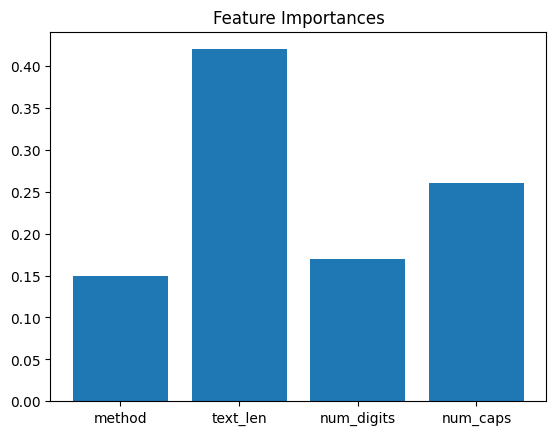

In [ ]:
import matplotlib.pyplot as plt

plt.bar(feature_cols, clf.feature_importances_)
plt.title("Feature Importances")
plt.show()

In [ ]:
import joblib
joblib.dump(clf, "ocr_selector_model.pkl")
print("Model saved as ocr_selector_model.pkl")

Model saved as ocr_selector_model.pkl
